# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. 

**Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.**

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
        
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. 

The gradient is computed by first creating a mixed image. 

This is done by weighing the fake and real image using epsilon and then adding them together. 

Once you have the intermediate image, you can get the critic's output on the image.

Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). 

You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [10]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        outputs=mixed_scores,
        inputs=mixed_images,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [11]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. 

First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. 

Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [41]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm-1)**2)
    #### END CODE HERE ####
    return penalty

In [42]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

**For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.**

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [43]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [44]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


**For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. **

**The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.**

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [51]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = crit_fake_pred.mean() - crit_real_pred.mean()  + c_lambda * gp
    #### END CODE HERE ####
    return crit_loss

In [52]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator. This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.07826587608084083, critic loss: 1.877076410204172


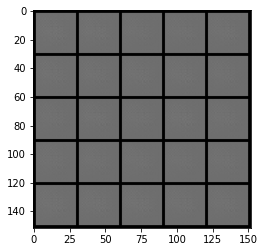

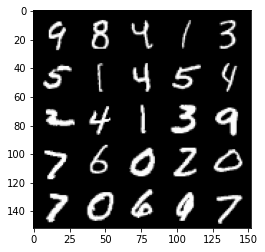

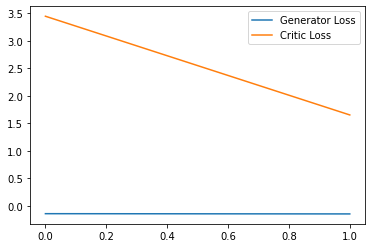

Step 100: Generator loss: 1.1008269409835338, critic loss: -2.177850844234228


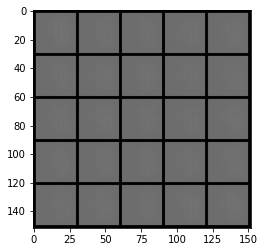

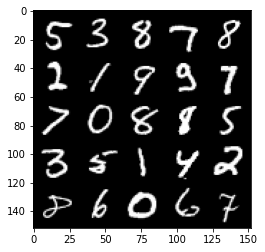

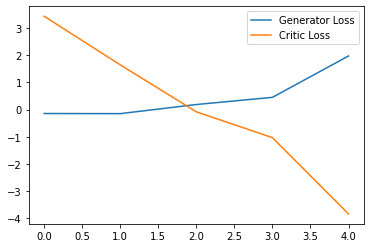

Step 150: Generator loss: 2.4172091990709306, critic loss: -11.21062070465088


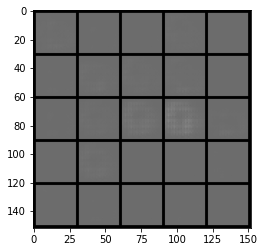

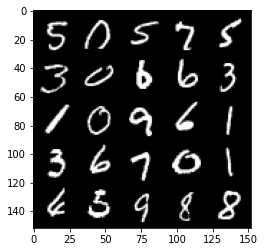

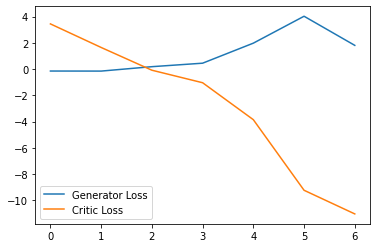

Step 200: Generator loss: -0.29100253598764536, critic loss: -28.894910011291504


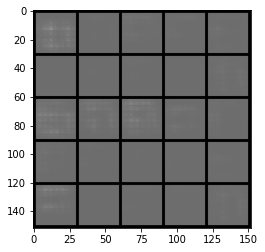

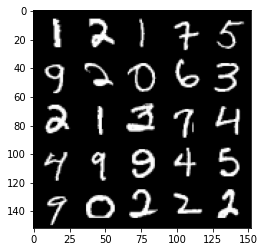

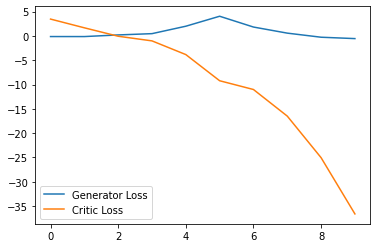

Step 250: Generator loss: -1.1271799425780773, critic loss: -62.347084594726574


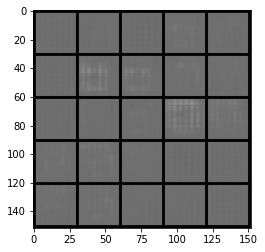

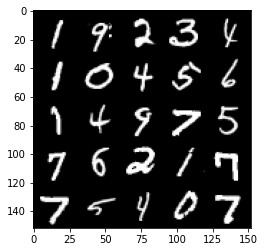

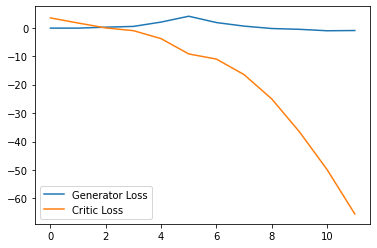

Step 300: Generator loss: -0.03915298879146576, critic loss: -103.63585612487792


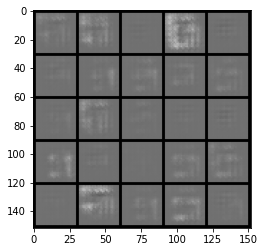

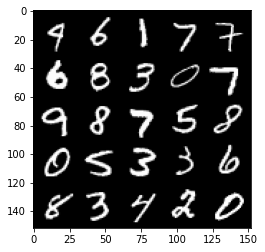

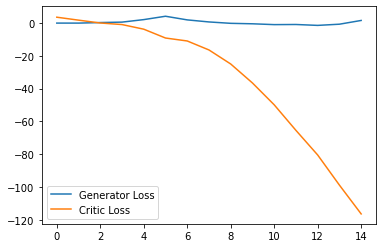

Step 350: Generator loss: 3.4011858248710634, critic loss: -154.96972882080078


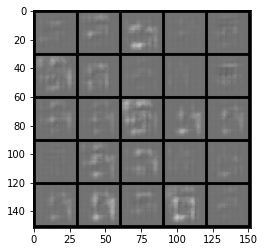

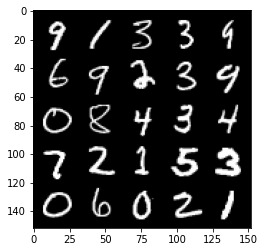

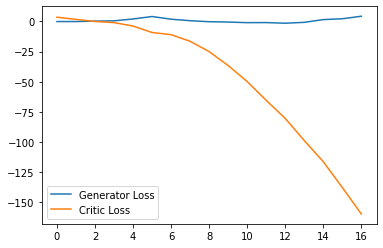

Step 400: Generator loss: 6.66498625934124, critic loss: -205.8480305175782


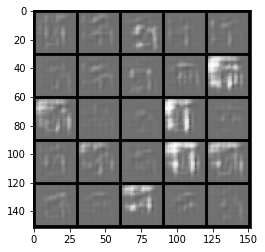

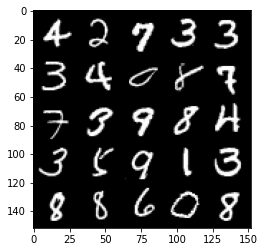

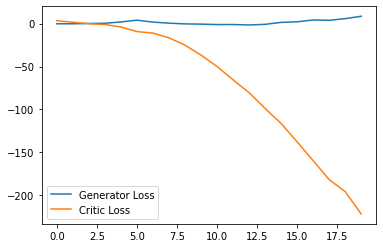

Step 450: Generator loss: -10.182528125047684, critic loss: -204.56476150512697


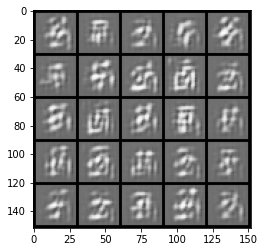

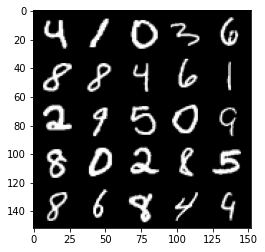

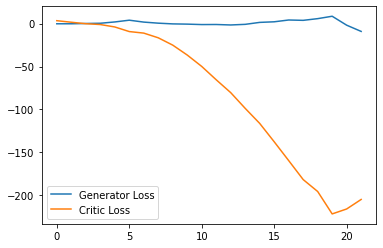

Step 500: Generator loss: 9.116795959472656, critic loss: -252.111911819458


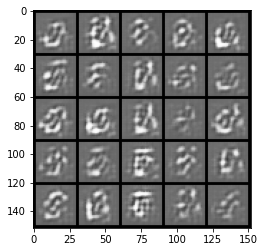

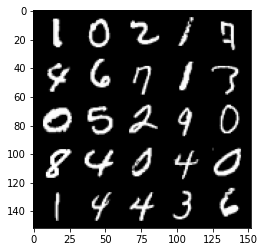

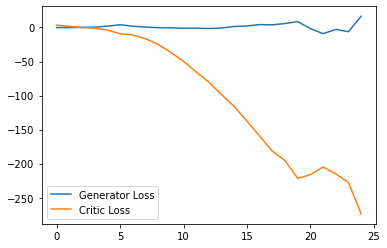

Step 550: Generator loss: 7.765207188129425, critic loss: -298.84488482666006


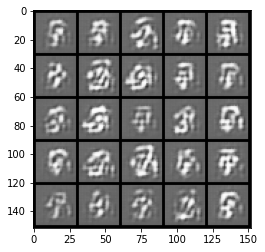

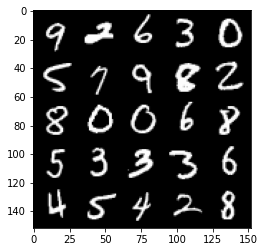

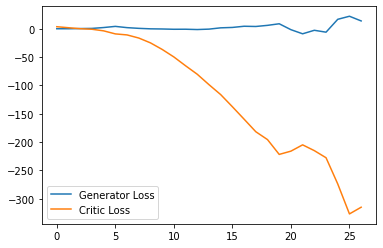

Step 600: Generator loss: 12.383064405918121, critic loss: -291.57692106628417


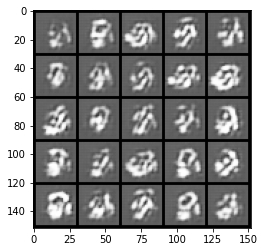

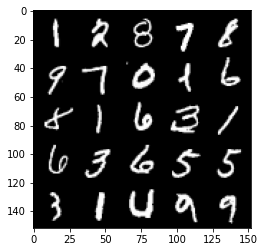

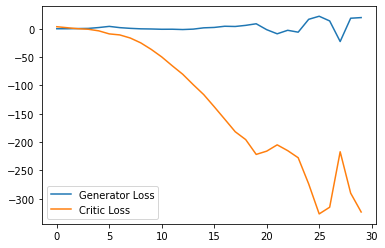

Step 650: Generator loss: 4.2058922570943835, critic loss: -343.26169189453117


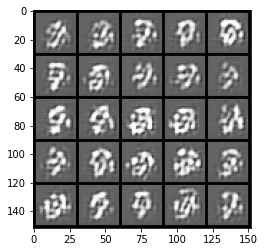

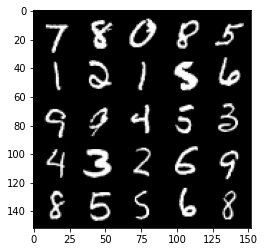

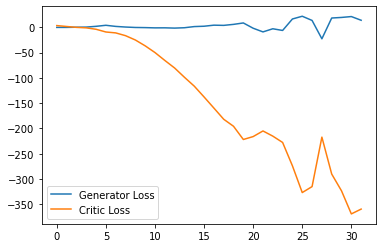

Step 700: Generator loss: -9.304336605072022, critic loss: -323.12274490356435


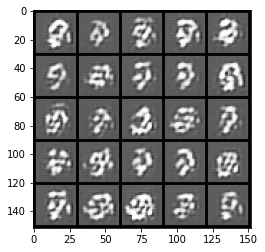

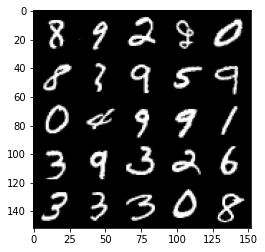

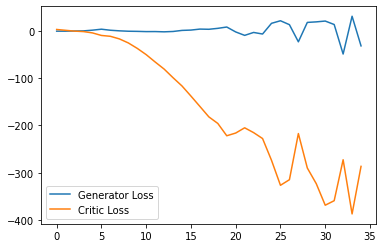

Step 750: Generator loss: -5.0095698869228364, critic loss: -289.83887246704097


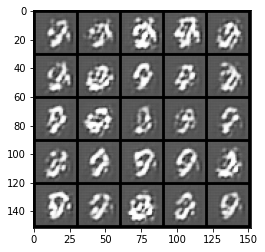

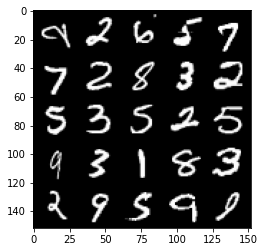

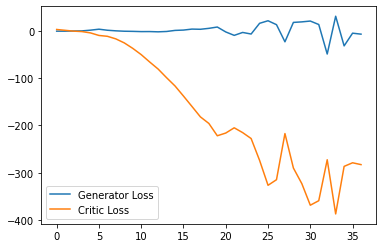

Step 800: Generator loss: 3.429222331047058, critic loss: -318.4840280456543


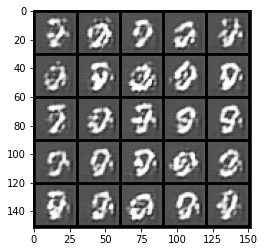

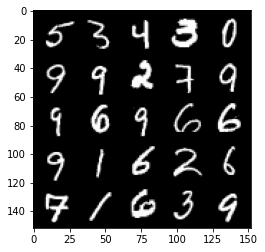

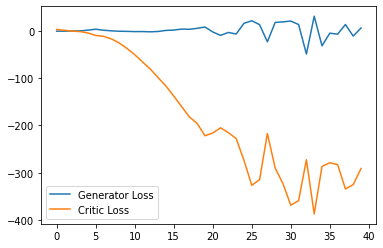

Step 850: Generator loss: -6.142911443710327, critic loss: -344.416726196289


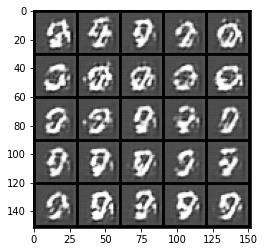

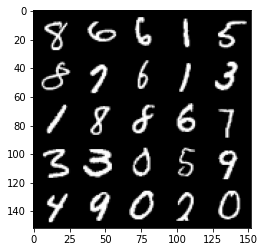

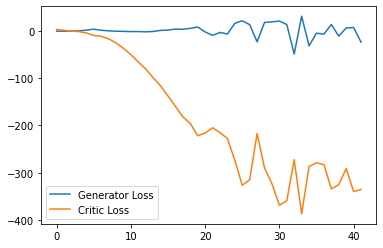

Step 900: Generator loss: 0.8221119809150695, critic loss: -323.37693637084953


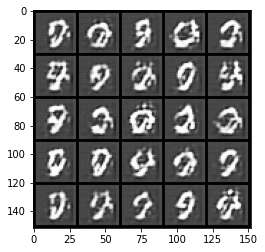

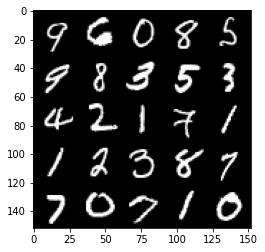

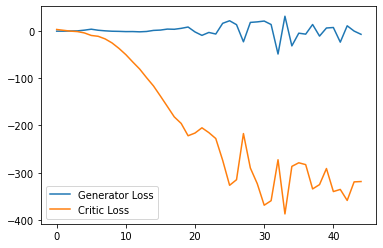

Step 950: Generator loss: -15.915342571735382, critic loss: -298.1185616760254


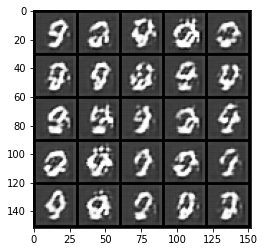

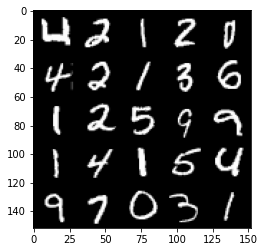

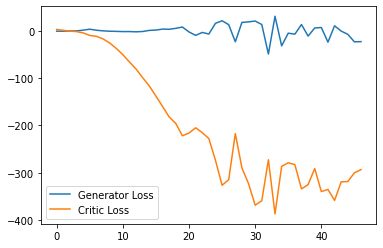

Step 1000: Generator loss: -52.363575582504275, critic loss: -164.86195008087157


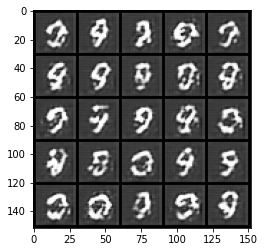

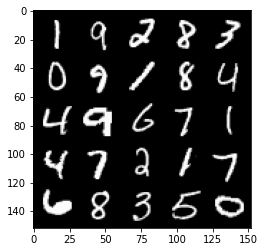

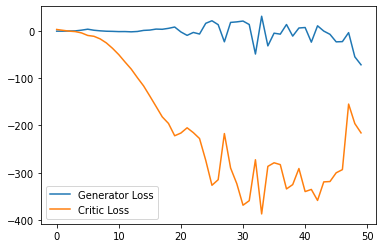

Step 1050: Generator loss: -51.25952064394951, critic loss: -209.34649099731448


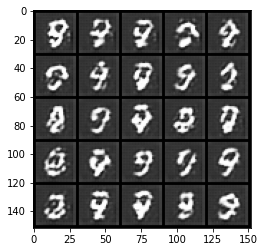

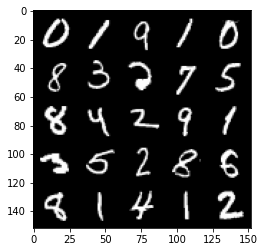

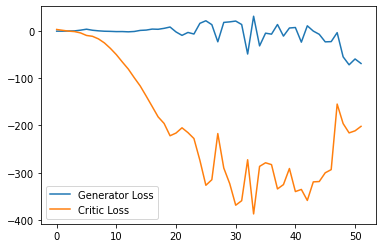

Step 1100: Generator loss: 0.6802058196067811, critic loss: -39.60078519821168


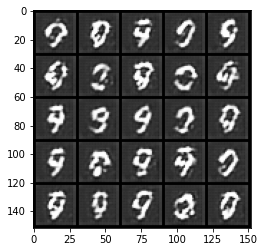

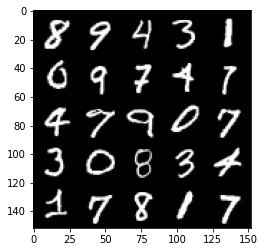

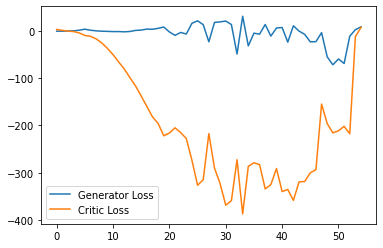

Step 1150: Generator loss: -27.693447399139405, critic loss: -86.69454106140137


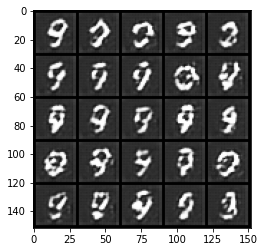

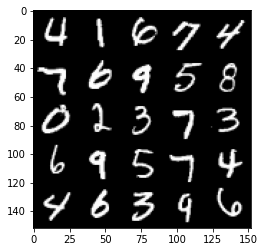

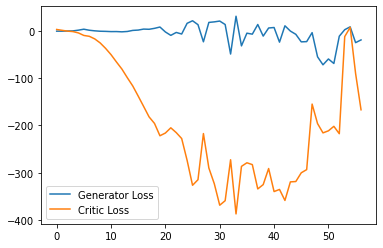

Step 1200: Generator loss: 24.987506103515624, critic loss: 13.362114040374754


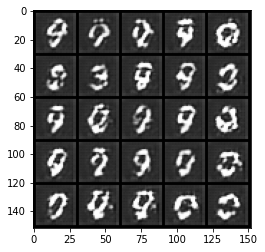

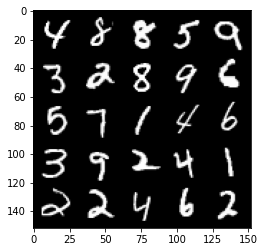

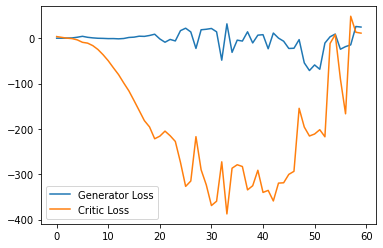

Step 1250: Generator loss: 21.416421089172363, critic loss: 7.515711307525635


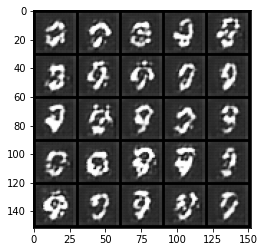

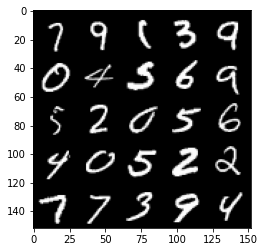

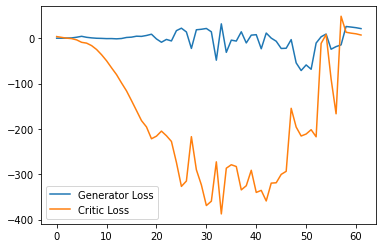

Step 1300: Generator loss: 16.218803424835205, critic loss: 11.28849189376831


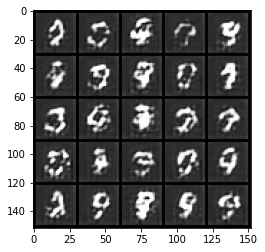

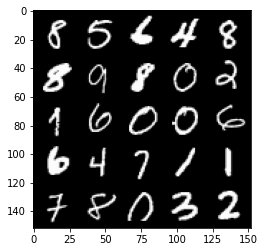

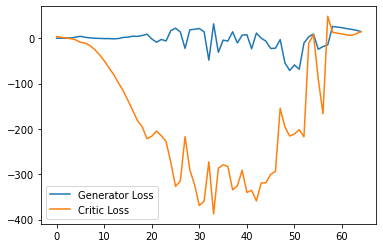

Step 1350: Generator loss: 11.095472221374513, critic loss: 18.85252238082886


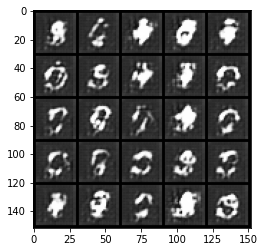

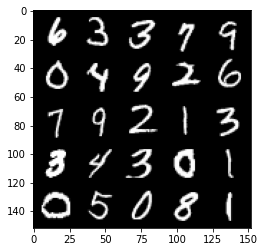

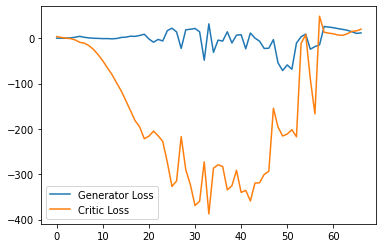

Step 1400: Generator loss: 10.916740322113037, critic loss: 25.268154819488533


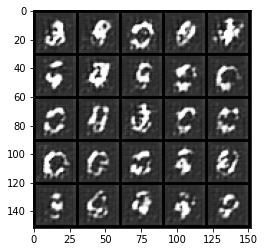

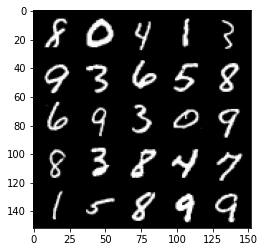

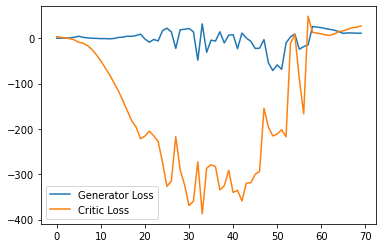

Step 1450: Generator loss: 9.679492454528809, critic loss: 27.849444465637198


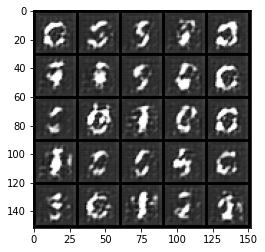

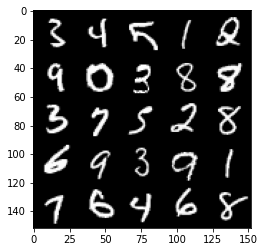

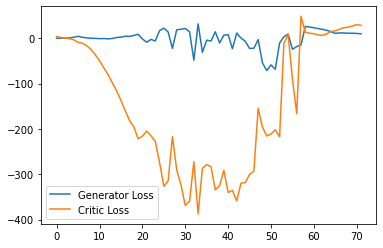

Step 1500: Generator loss: 7.407835998535156, critic loss: 16.10085158729553


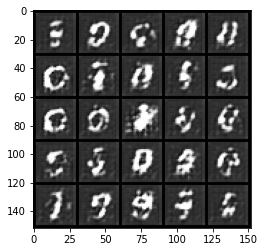

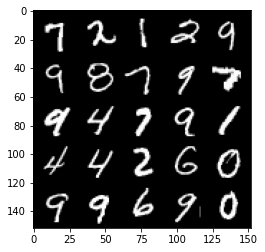

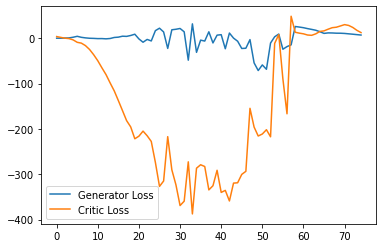

Step 1550: Generator loss: 6.4112271976470945, critic loss: 11.143065011978148


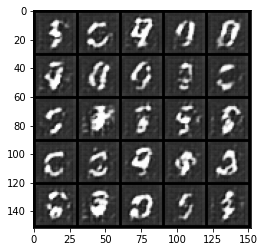

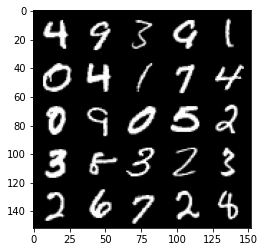

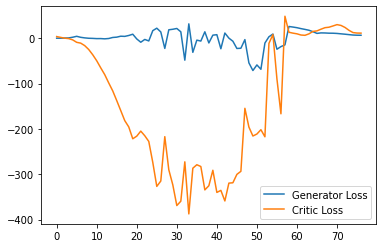

Step 1600: Generator loss: 6.108725662231445, critic loss: 10.578778522491454


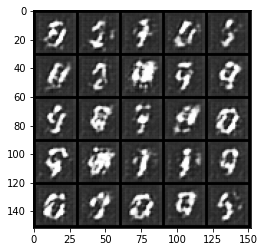

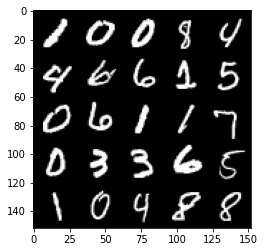

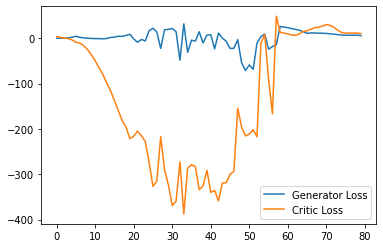

Step 1650: Generator loss: 5.038029270172119, critic loss: 6.285750904083251


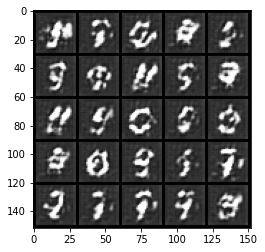

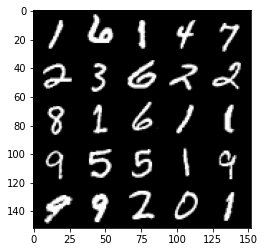

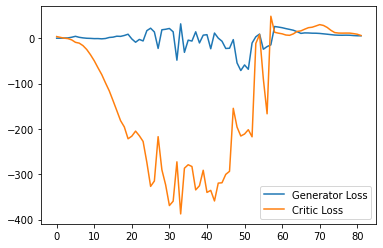

Step 1700: Generator loss: 4.134200959205628, critic loss: 0.6821567325592042


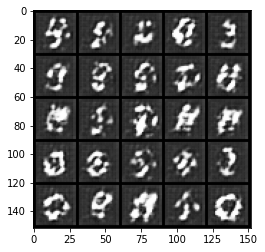

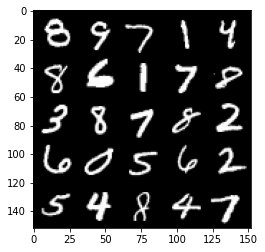

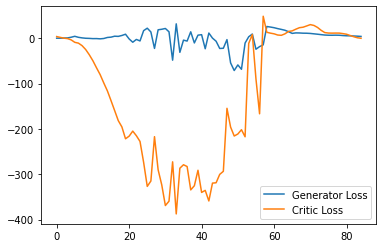

Step 1750: Generator loss: 3.3022372722625732, critic loss: -1.5767783622741698


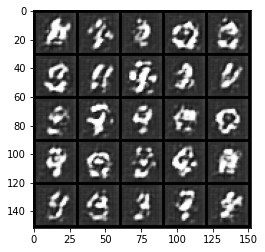

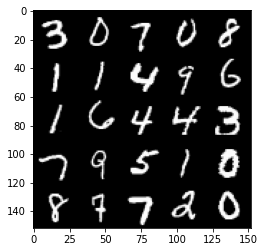

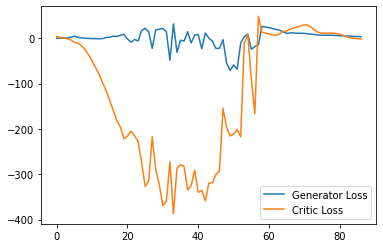

Step 1800: Generator loss: 2.8494780015945436, critic loss: -1.9690752725601188


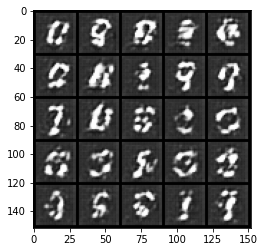

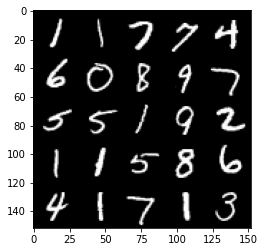

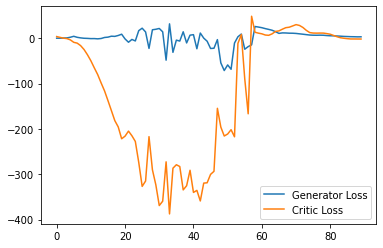

Step 1850: Generator loss: 2.5008037161827086, critic loss: -2.3694027261734014


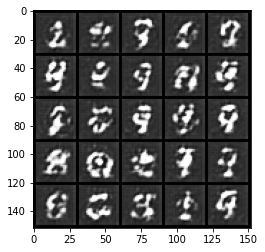

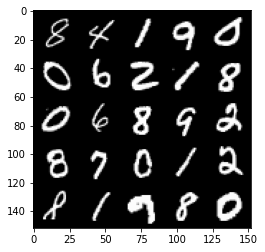

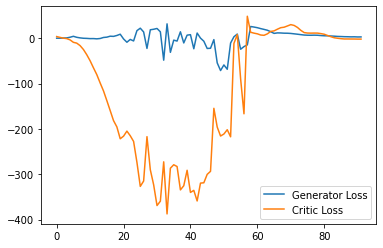

Step 1900: Generator loss: 1.8733651471138, critic loss: -3.558204344749451


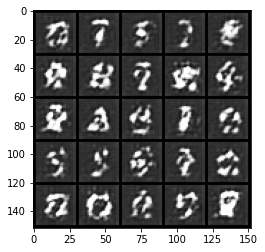

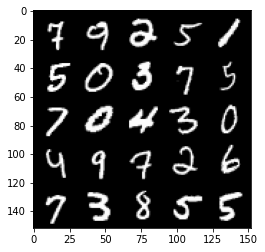

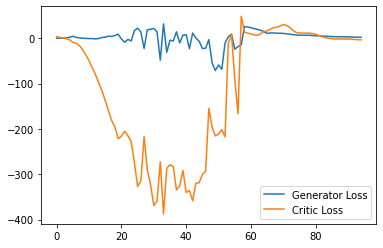

Step 1950: Generator loss: -0.36540765590965746, critic loss: -4.266542381286621


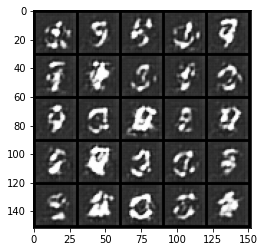

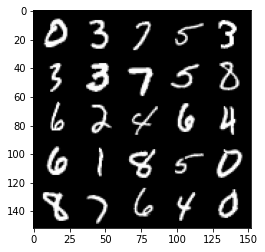

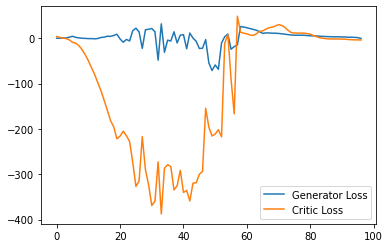

Step 2000: Generator loss: -4.652484382390976, critic loss: -6.49617791748047


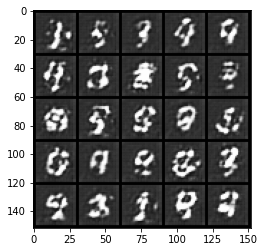

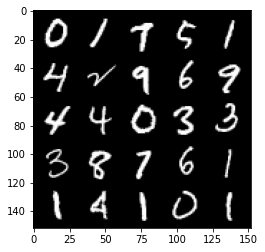

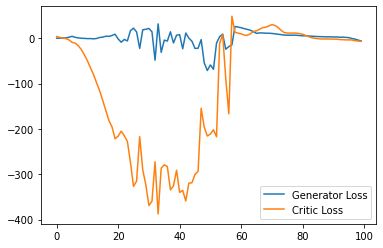

Step 2050: Generator loss: -6.950608376264572, critic loss: -9.577164085388183


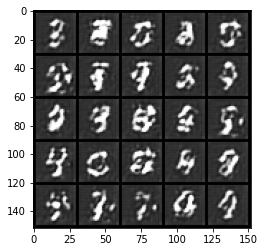

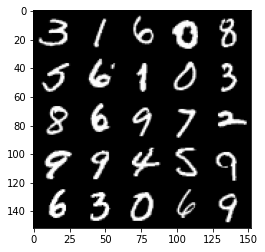

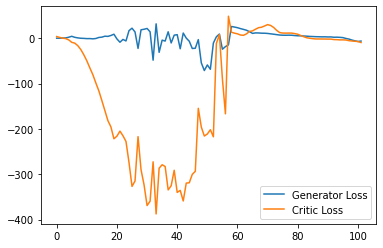

Step 2100: Generator loss: -5.0417884626984595, critic loss: -16.14038953018188


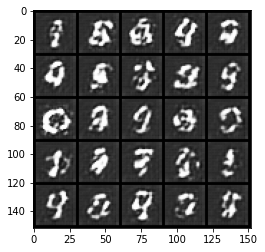

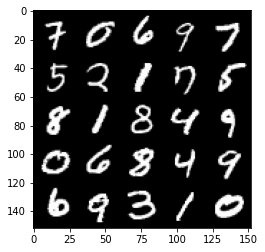

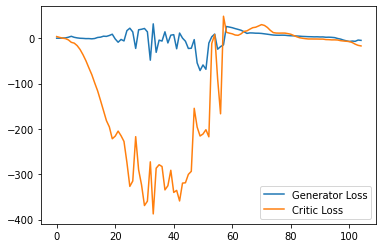

Step 2150: Generator loss: -3.9370086885988713, critic loss: -21.303103874206545


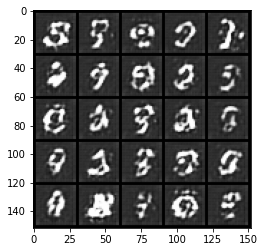

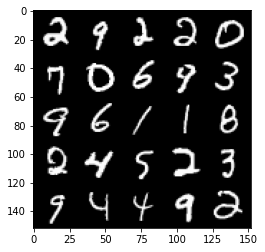

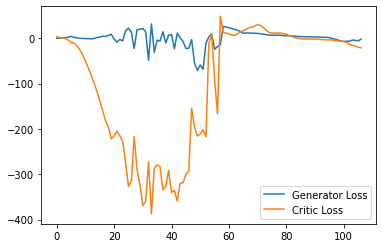

Step 2200: Generator loss: -4.304984489679336, critic loss: -20.5763323097229


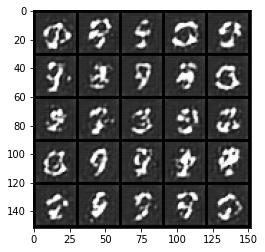

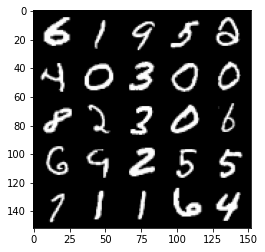

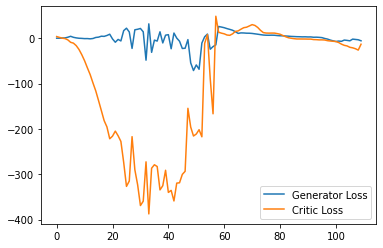

Step 2250: Generator loss: -7.458736536800862, critic loss: -25.38077203178406


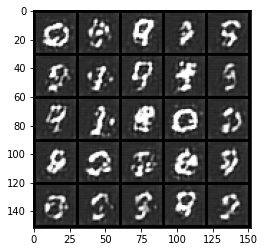

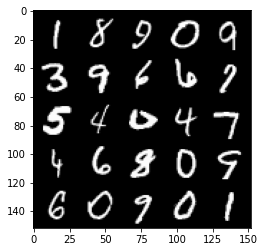

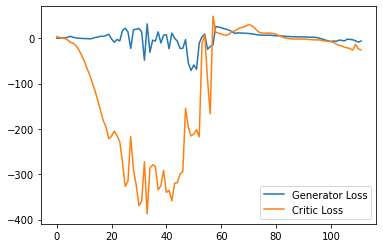

Step 2300: Generator loss: -5.53578841894865, critic loss: -28.379126609802242


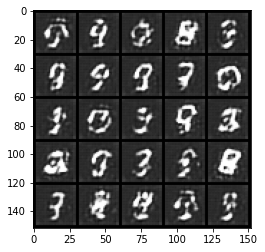

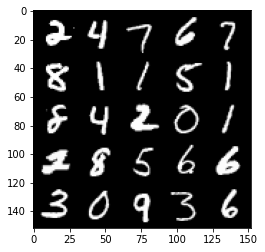

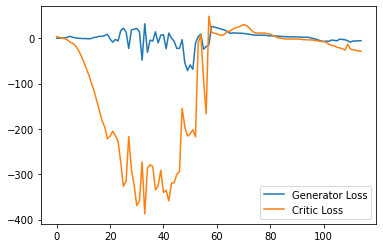

Step 2350: Generator loss: -5.534481734037399, critic loss: -29.249412567138663


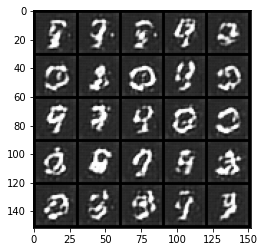

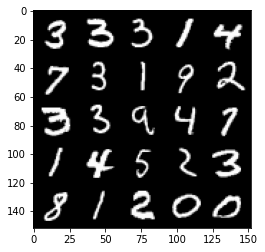

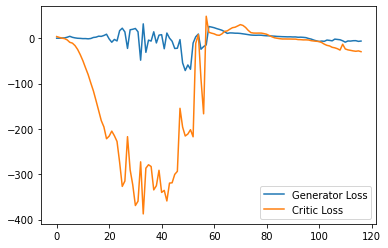

Step 2400: Generator loss: -4.538584726452828, critic loss: -31.679098213195793


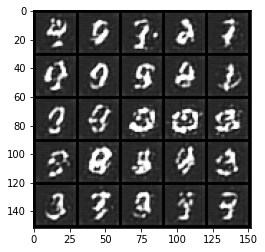

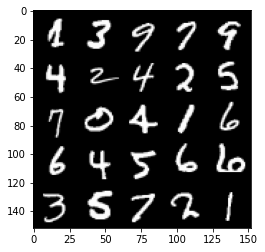

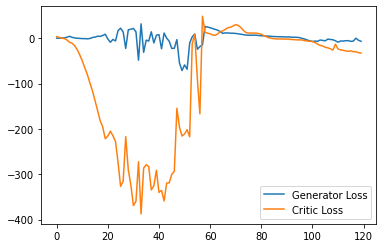

Step 2450: Generator loss: -0.27897862911224364, critic loss: -32.34150188446045


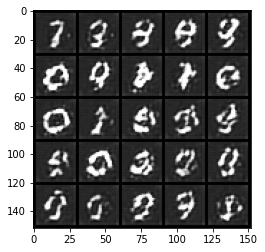

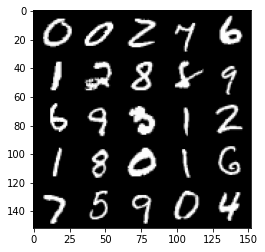

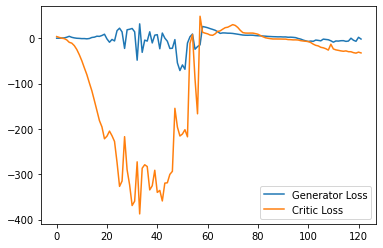

Step 2500: Generator loss: -1.612293359786272, critic loss: -32.82555768966676


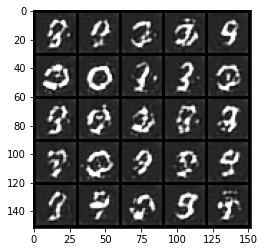

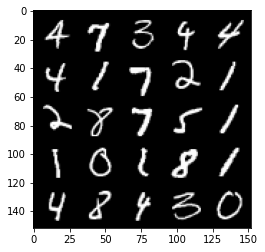

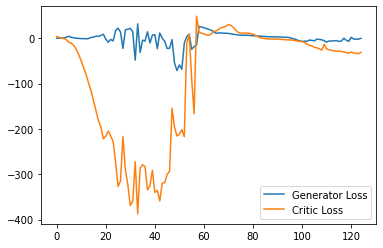

Step 2550: Generator loss: 2.8453653943538666, critic loss: -33.33708990859986


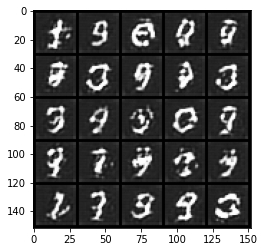

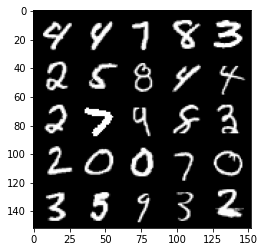

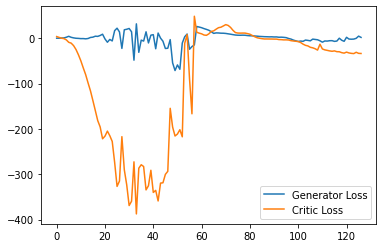

Step 2600: Generator loss: 2.4109141105413436, critic loss: -24.481609027862547


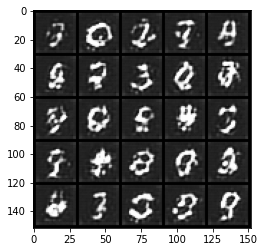

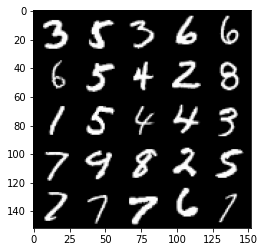

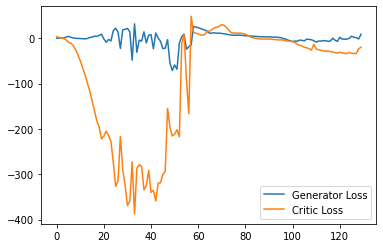

Step 2650: Generator loss: 5.1058691662549975, critic loss: -29.200951635360717


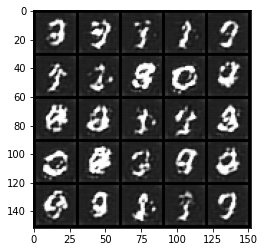

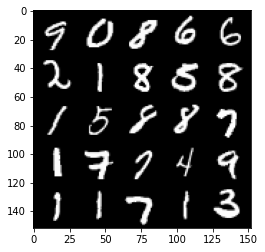

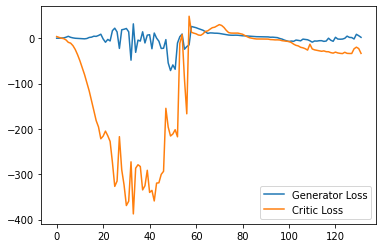

Step 2700: Generator loss: 8.116149516105652, critic loss: -23.41583690452576


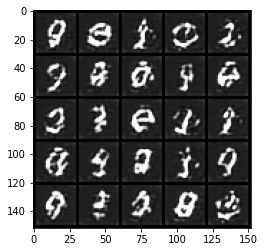

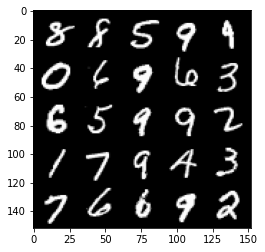

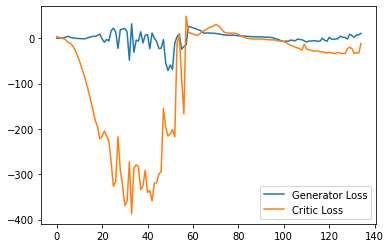

Step 2750: Generator loss: 9.08355394244194, critic loss: -15.546032363891602


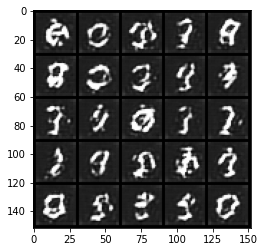

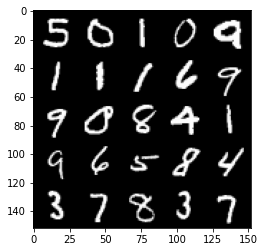

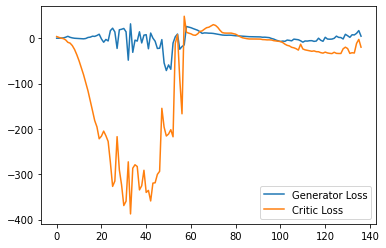

Step 2800: Generator loss: 7.27584285736084, critic loss: -29.156433790206894


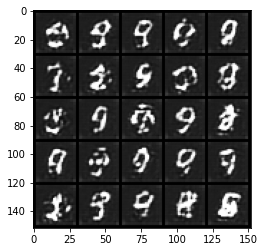

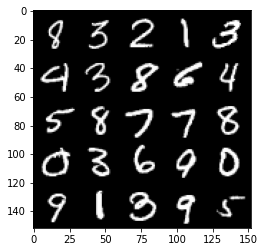

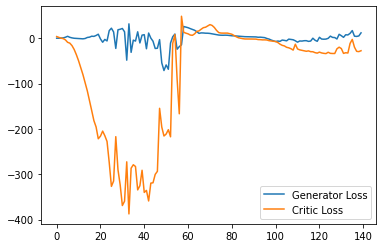

Step 2850: Generator loss: 7.756080541014671, critic loss: -26.95171477317811


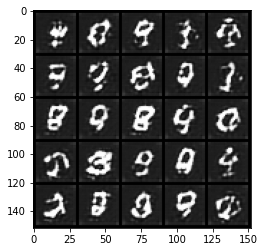

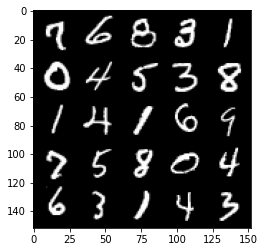

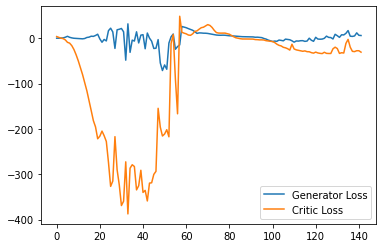

Step 2900: Generator loss: 11.84322321355343, critic loss: -24.56943431091308


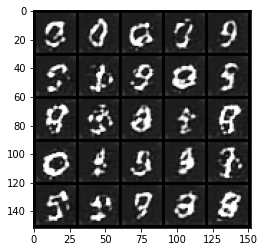

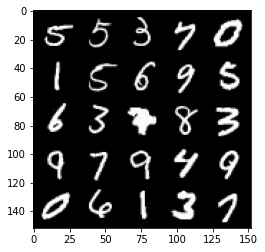

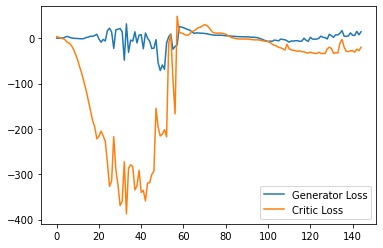

Step 2950: Generator loss: 10.739777107238769, critic loss: -29.790473049163822


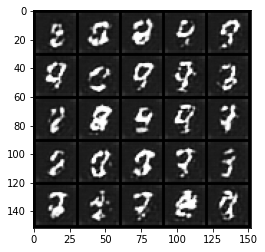

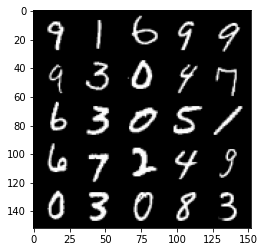

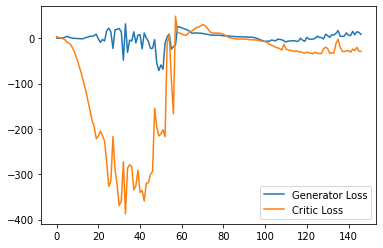

Step 3000: Generator loss: 17.26135619044304, critic loss: -13.21121509075165


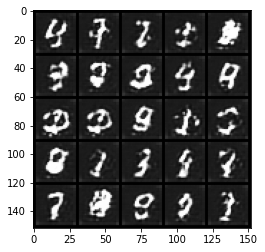

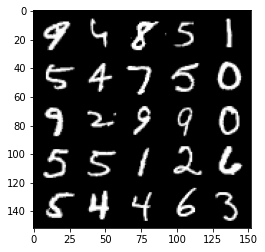

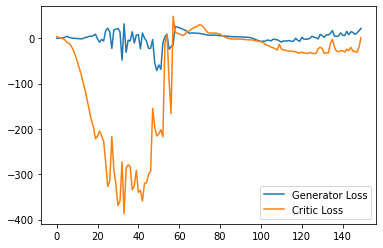

Step 3050: Generator loss: 23.835481758117677, critic loss: -1.2895327863693231


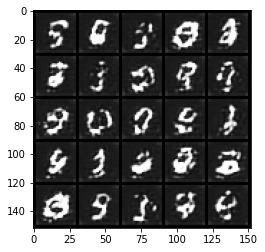

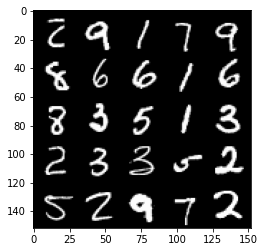

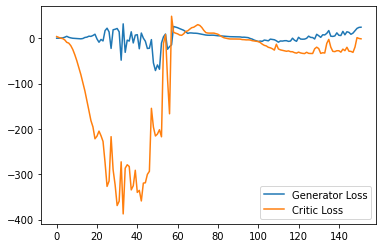

Step 3100: Generator loss: 17.992706422805785, critic loss: -9.232910965919496


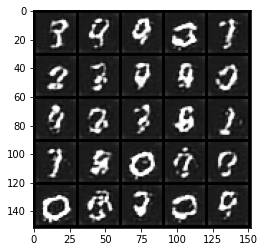

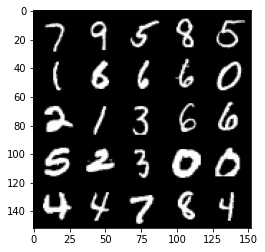

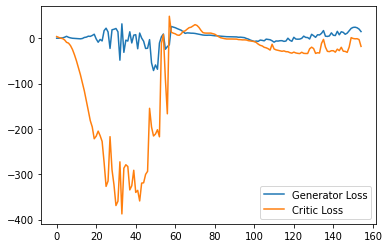

Step 3150: Generator loss: 13.675560173988343, critic loss: -21.38589963531493


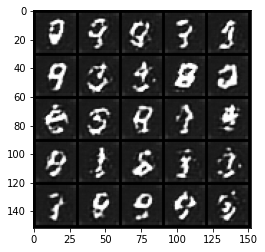

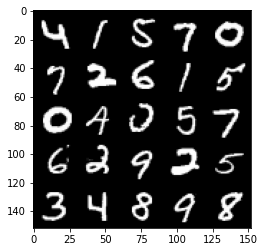

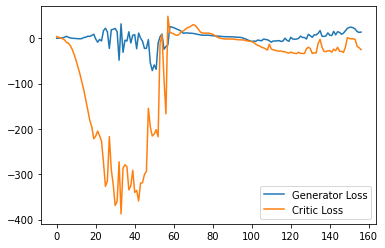

Step 3200: Generator loss: 30.937668113708497, critic loss: -0.44770963001251196


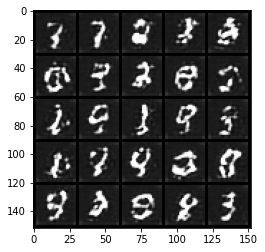

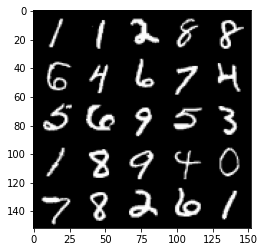

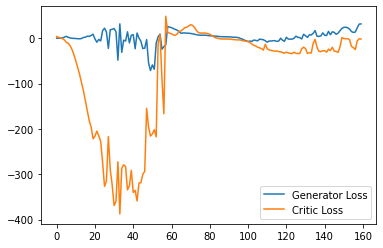

Step 3250: Generator loss: 27.147808227539063, critic loss: -6.770889461517332


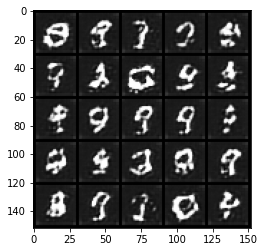

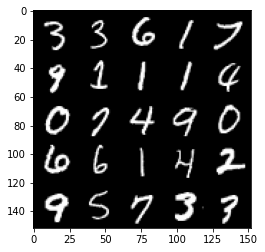

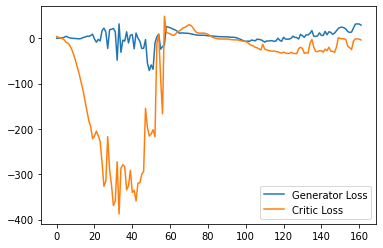

Step 3300: Generator loss: 20.663605737686158, critic loss: -20.447966624259944


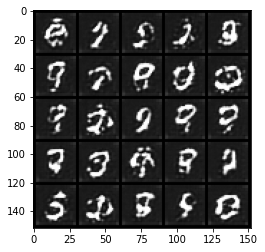

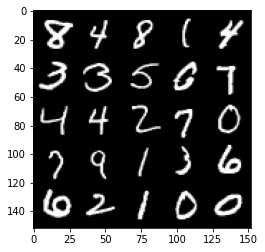

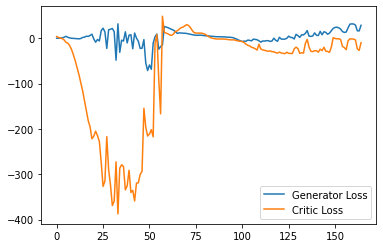

Step 3350: Generator loss: 23.415161282420158, critic loss: -24.10166826057434


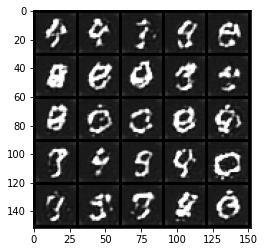

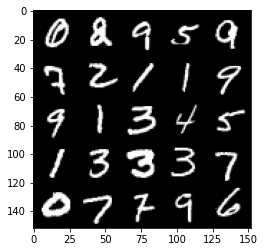

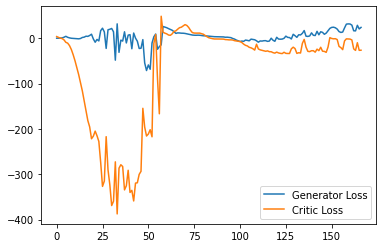

Step 3400: Generator loss: 25.121616287231447, critic loss: -19.218269668579094


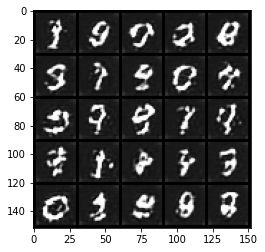

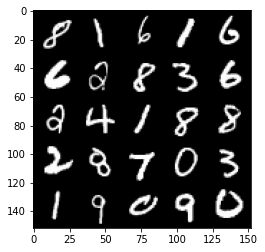

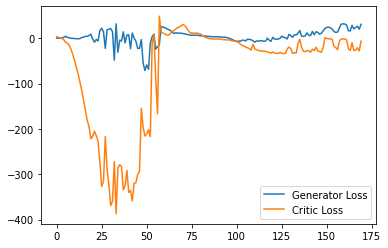

Step 3450: Generator loss: 38.06977577209473, critic loss: -2.5699454894065856


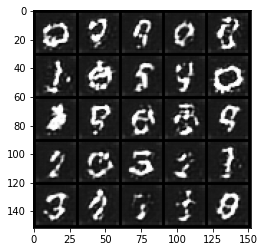

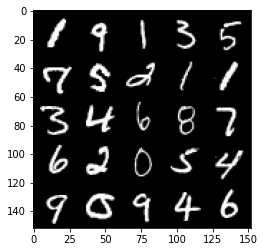

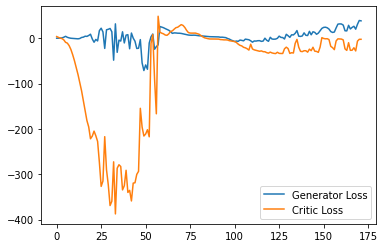

Step 3500: Generator loss: 33.57833511352539, critic loss: -2.4022953195571906


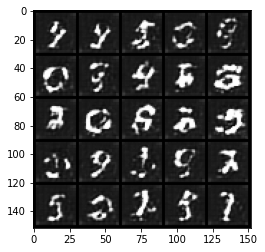

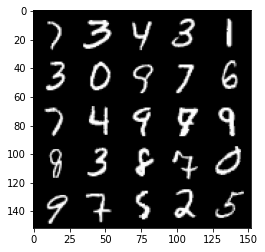

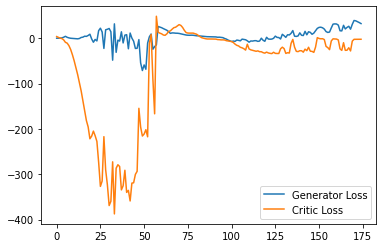

Step 3550: Generator loss: 23.139636340141298, critic loss: -21.772118896484375


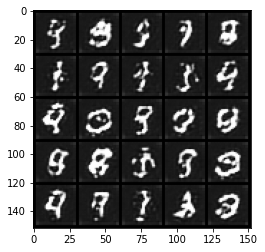

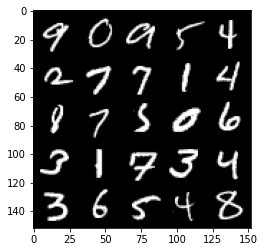

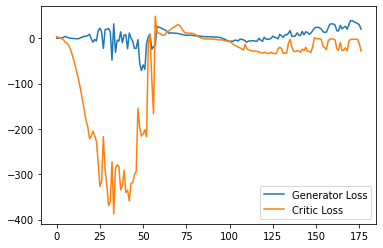

Step 3600: Generator loss: 37.72441318511963, critic loss: -4.73585885667801


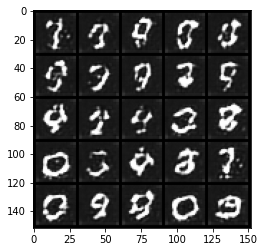

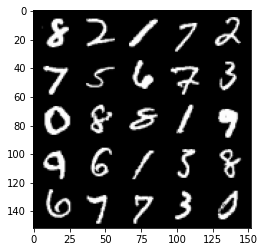

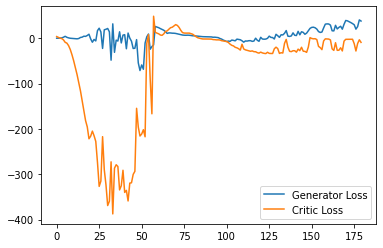

Step 3650: Generator loss: 26.486411628723143, critic loss: -25.911457340240478


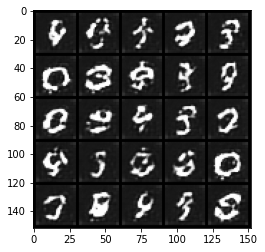

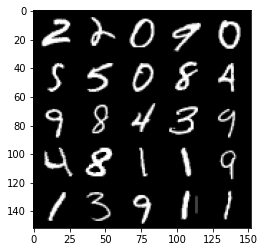

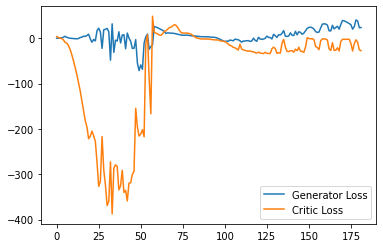

Step 3700: Generator loss: 32.92173696517944, critic loss: -12.399914697647096


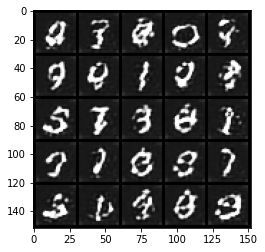

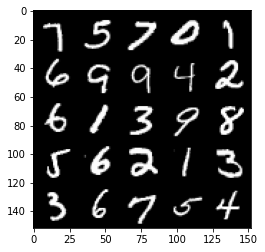

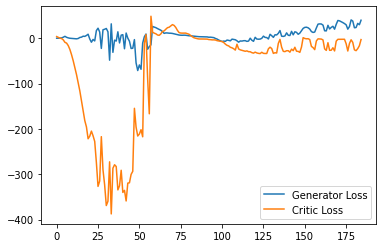

Step 3750: Generator loss: 33.451610984802244, critic loss: -13.538804648399353


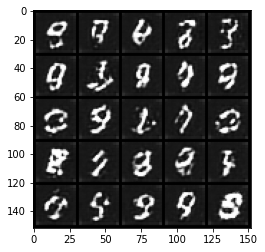

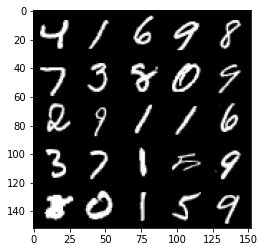

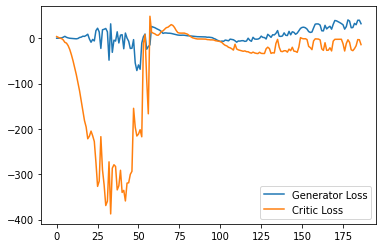

Step 3800: Generator loss: 26.334002876281737, critic loss: -27.875327519416814


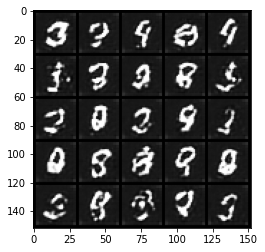

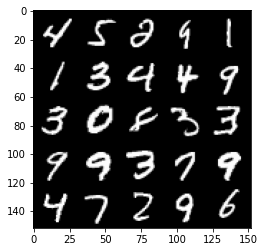

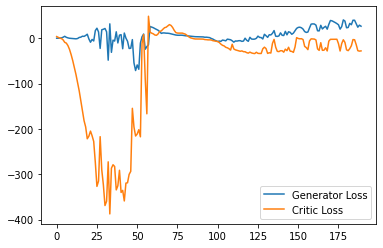

Step 3850: Generator loss: 36.1581262254715, critic loss: -6.463964246273041


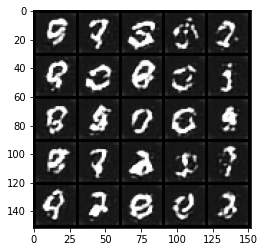

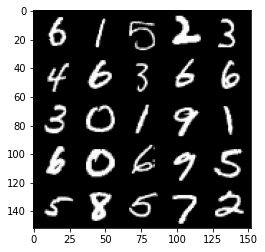

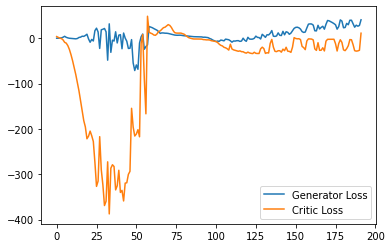

Step 3900: Generator loss: 38.84933792114258, critic loss: -3.2088008842468265


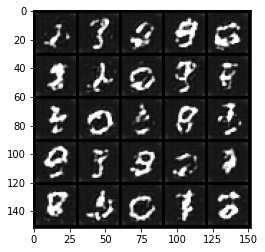

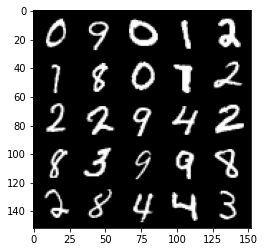

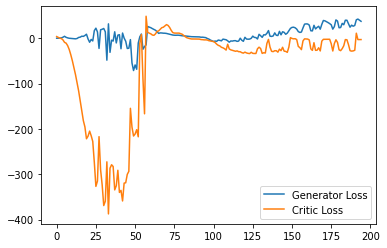

Step 3950: Generator loss: 35.638174057006836, critic loss: -4.549972857952118


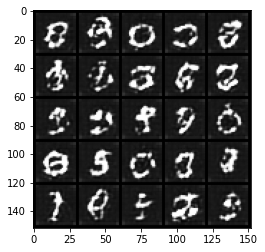

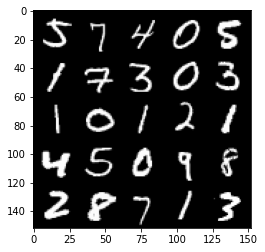

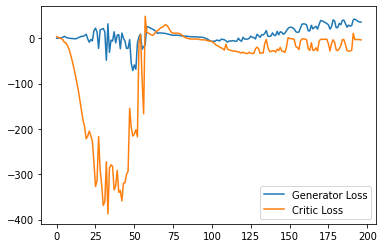

Step 4000: Generator loss: 26.53873815536499, critic loss: -24.96391817474364


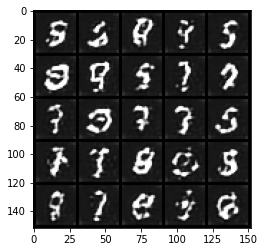

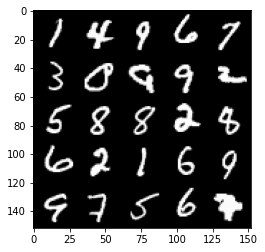

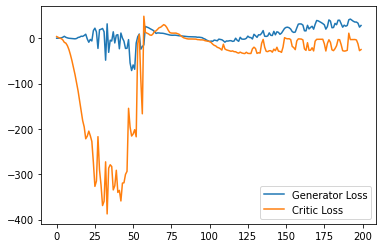

Step 4050: Generator loss: 26.842280235290527, critic loss: -26.453508525848385


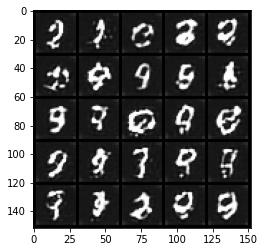

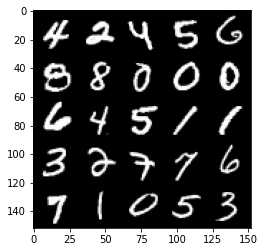

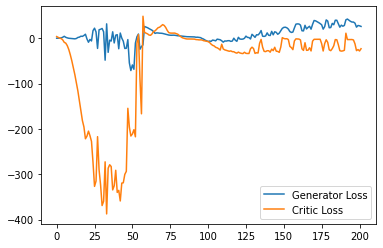

Step 4100: Generator loss: 37.14240028381348, critic loss: -0.7979870257377631


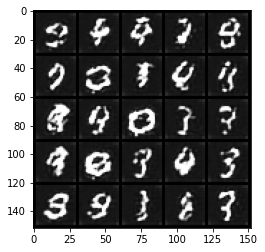

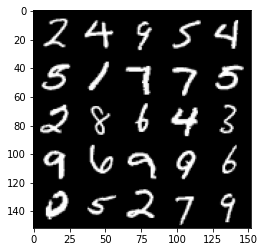

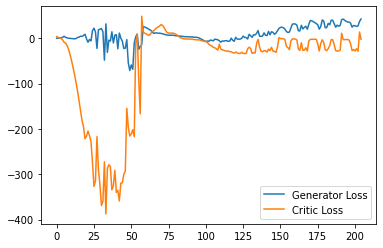

Step 4150: Generator loss: 41.022792434692384, critic loss: -2.465033414363861


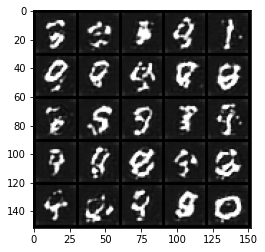

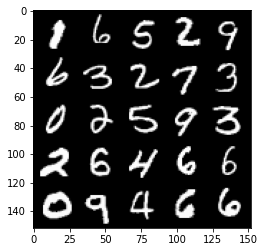

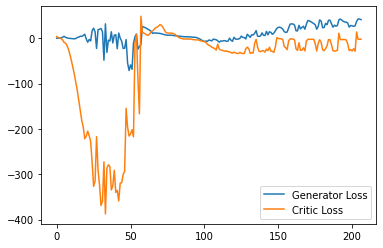

Step 4200: Generator loss: 38.20448455810547, critic loss: -2.400722995758057


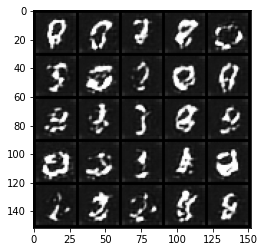

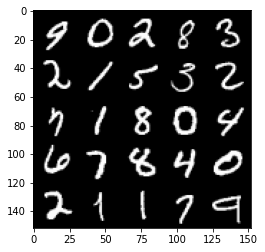

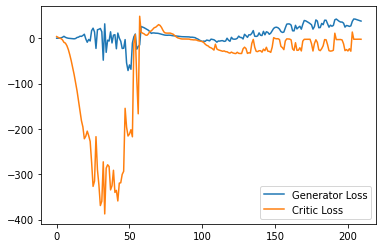

Step 4250: Generator loss: 36.68089775085449, critic loss: -2.742938980102539


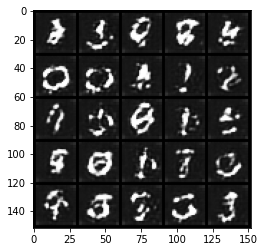

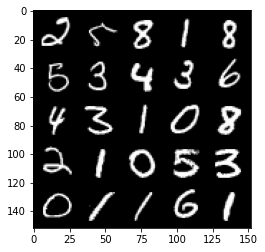

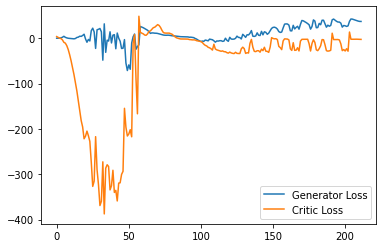

Step 4300: Generator loss: 36.22545387268067, critic loss: -2.7477210574150086


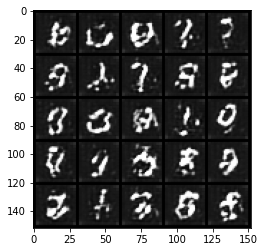

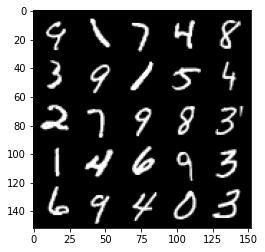

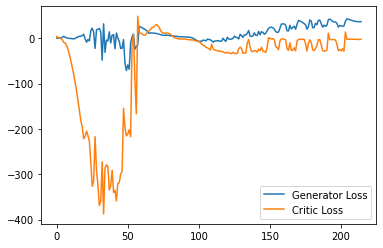

Step 4350: Generator loss: 36.22792381286621, critic loss: -2.8697699880599976


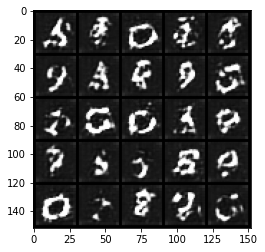

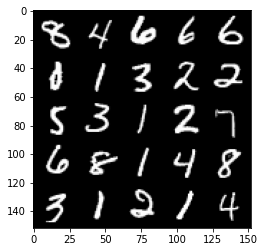

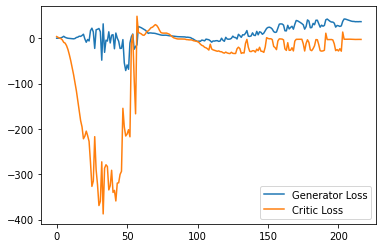

Step 4400: Generator loss: 35.66379020690918, critic loss: -3.3913126001358034


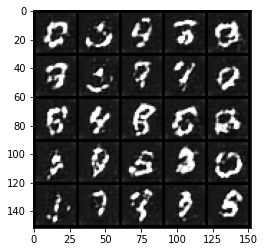

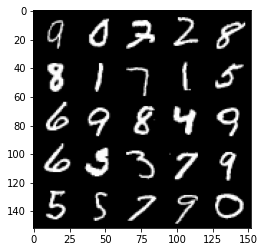

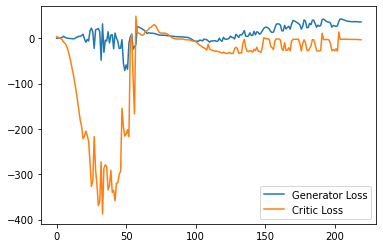

Step 4450: Generator loss: 33.00849563598633, critic loss: -8.543145625114443


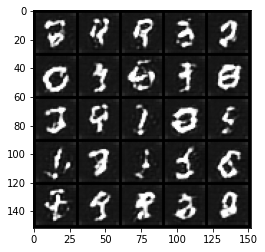

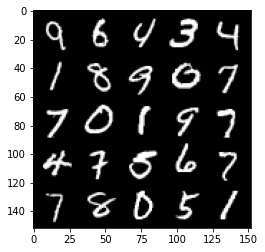

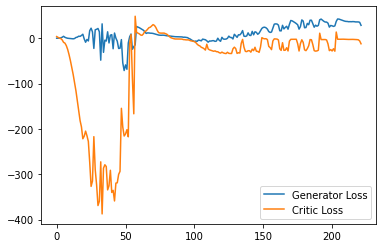

Step 4500: Generator loss: 32.7888315153122, critic loss: -12.379019640922547


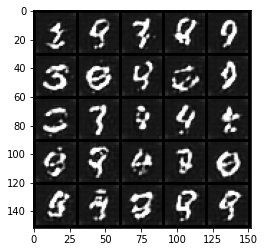

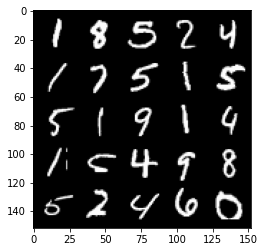

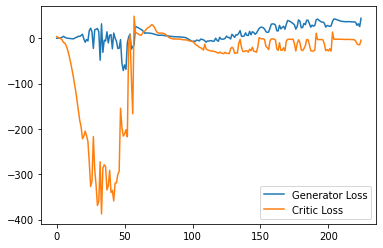

Step 4550: Generator loss: 30.822964363098144, critic loss: -23.403516626358034


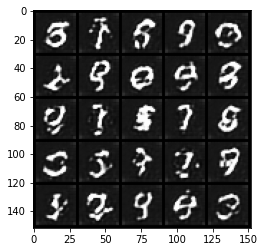

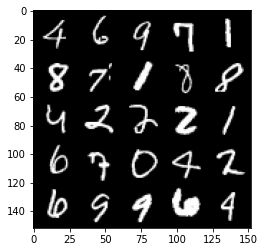

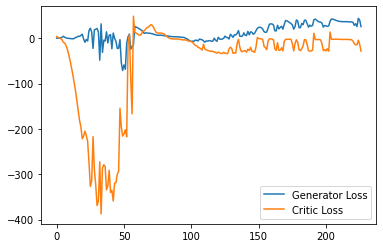

Step 4600: Generator loss: 36.39214832305908, critic loss: -12.82108969593048


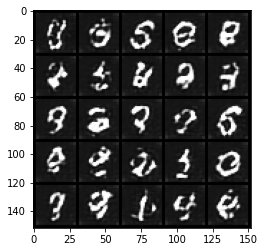

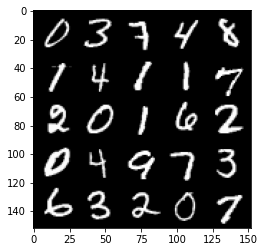

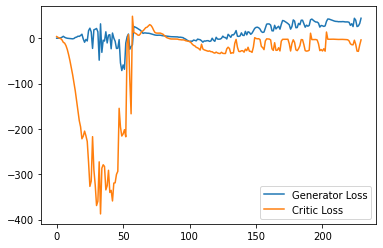

Step 4650: Generator loss: 38.20852779388428, critic loss: -11.31970223236084


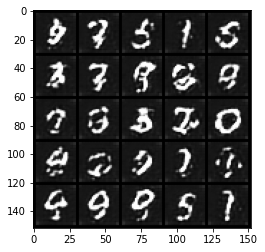

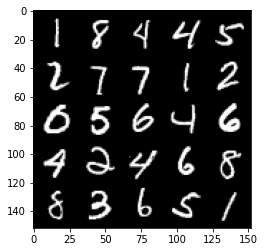

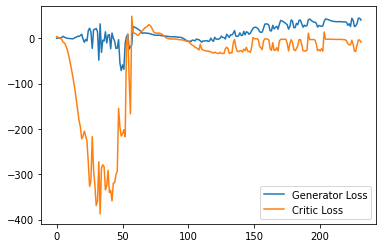

Step 4700: Generator loss: 29.328259353637694, critic loss: -26.929022466659543


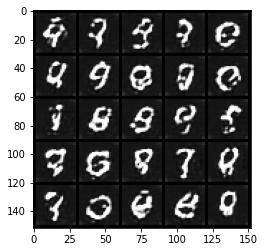

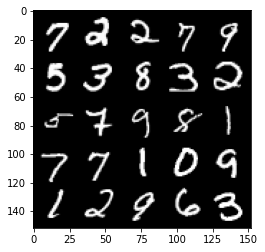

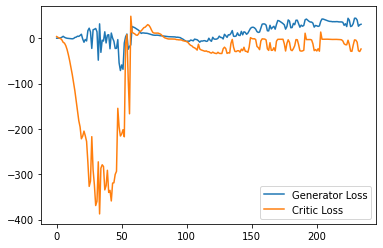

Step 4750: Generator loss: 34.52487506866455, critic loss: -21.388699317932133


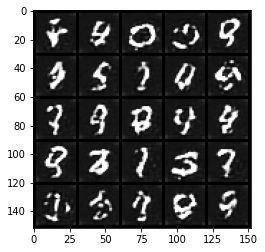

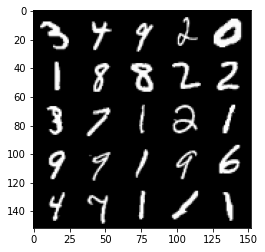

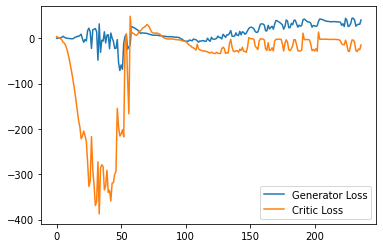

Step 4800: Generator loss: 31.527696800231933, critic loss: -24.25779705810546


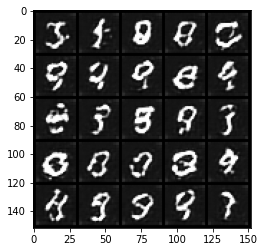

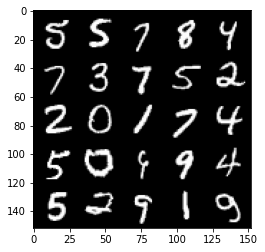

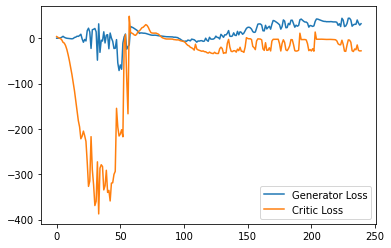

Step 4850: Generator loss: 46.20960472106933, critic loss: -4.362035560607912


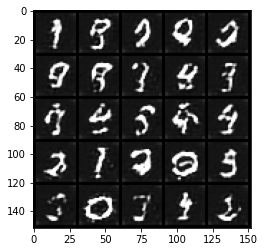

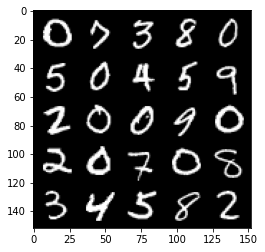

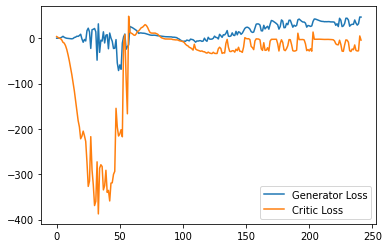

Step 4900: Generator loss: 31.05126636505127, critic loss: -22.592524658203125


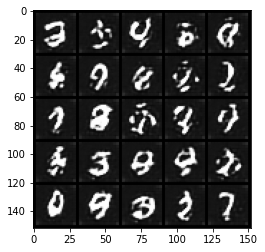

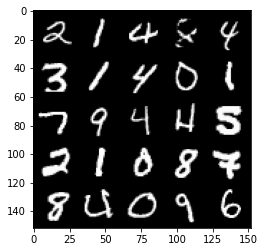

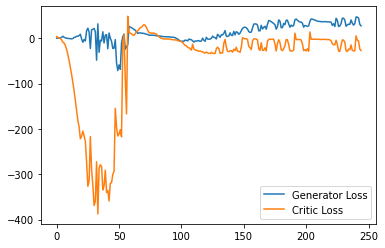

Step 4950: Generator loss: 31.127449378967285, critic loss: -24.12603805828094


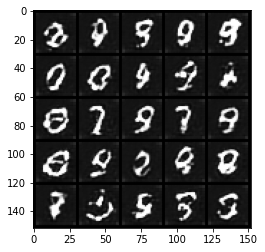

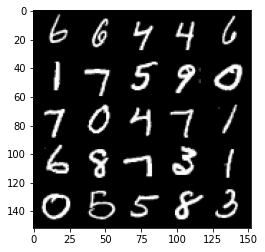

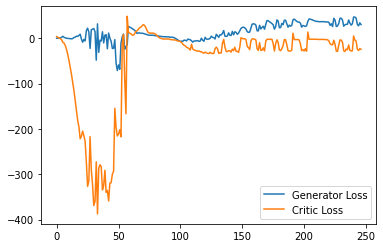

Step 5000: Generator loss: 36.53435634613037, critic loss: -18.82784983921051


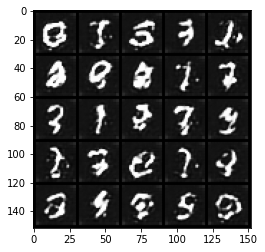

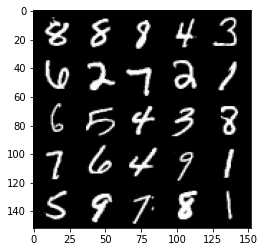

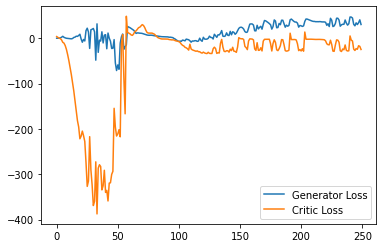

Step 5050: Generator loss: 34.27016181945801, critic loss: -20.283864294052123


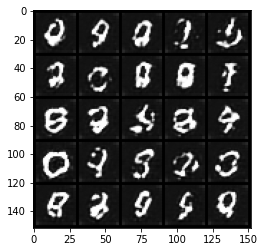

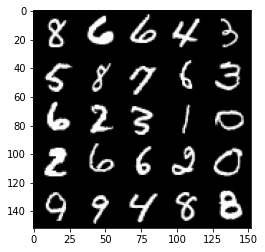

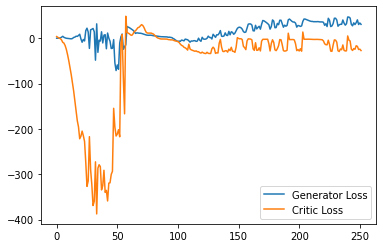

Step 5100: Generator loss: 42.855736846923826, critic loss: -3.94664506006241


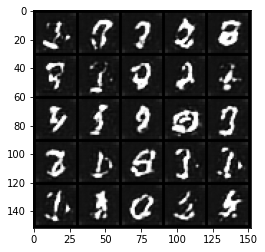

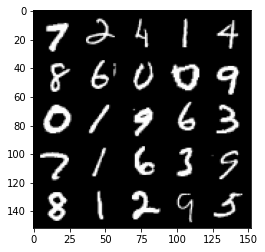

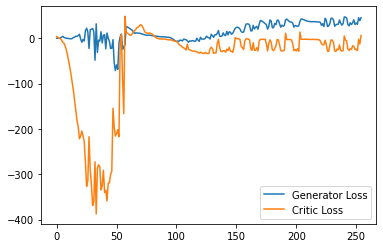

Step 5150: Generator loss: 43.86931037902832, critic loss: -3.6928547964096072


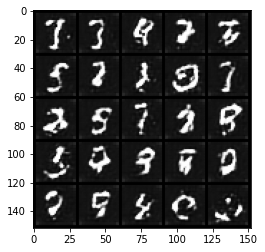

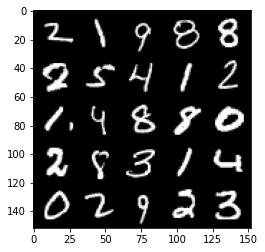

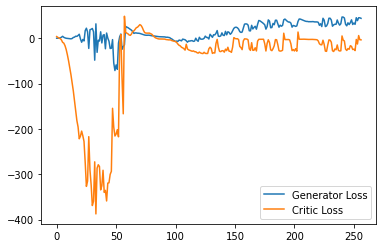

Step 5200: Generator loss: 36.34227466583252, critic loss: -13.452271852493286


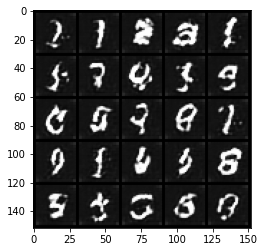

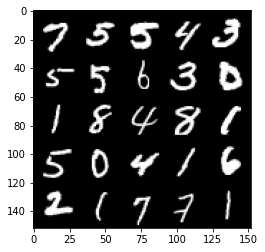

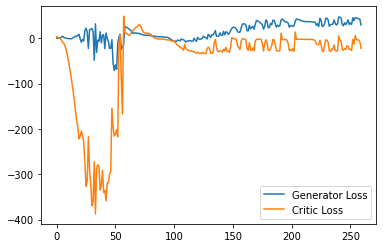

Step 5250: Generator loss: 29.1752632522583, critic loss: -24.564767157554634


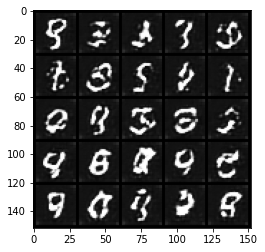

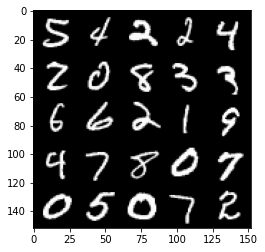

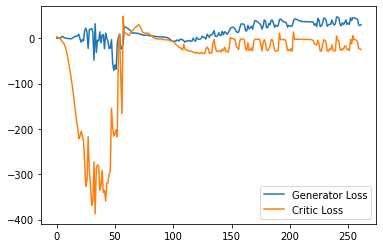

Step 5300: Generator loss: 39.38655258178711, critic loss: -14.721822171211242


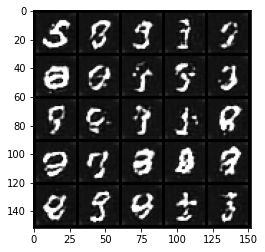

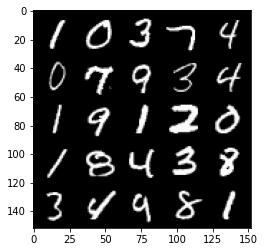

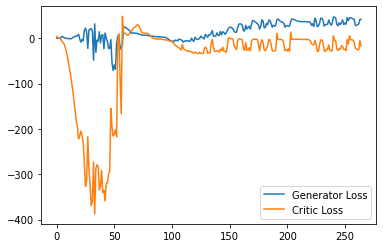

Step 5350: Generator loss: 35.834426193237306, critic loss: -4.082691679954526


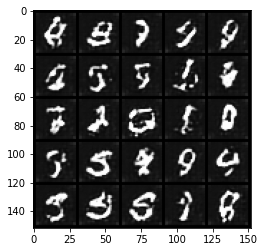

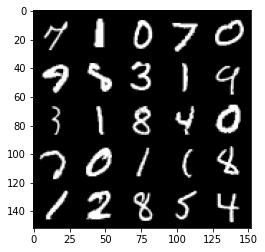

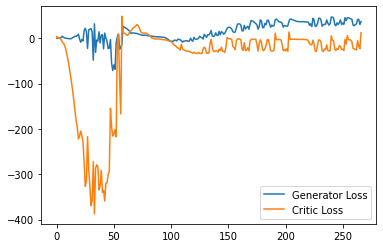

Step 5400: Generator loss: 45.16189727783203, critic loss: -2.144226363182068


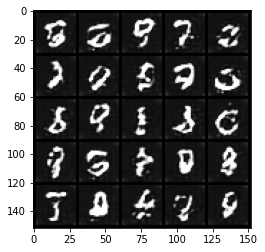

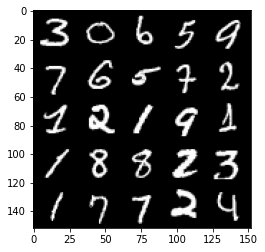

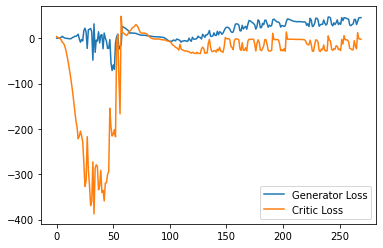

Step 5450: Generator loss: 44.21122718811035, critic loss: -2.201148354530334


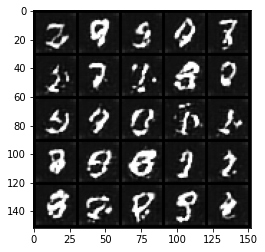

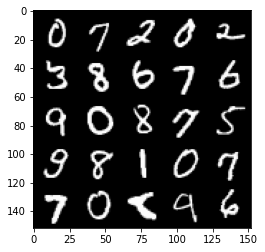

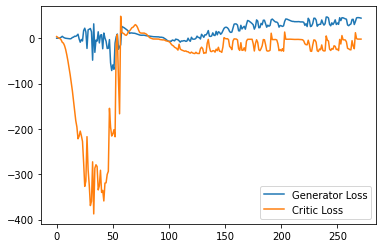

Step 5500: Generator loss: 42.89998077392578, critic loss: -2.3274425015449527


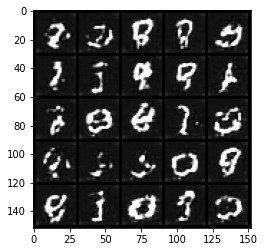

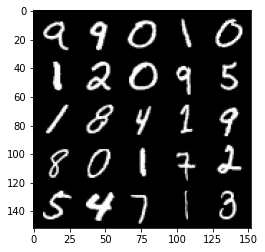

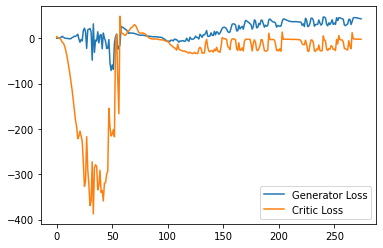

Step 5550: Generator loss: 42.29728210449219, critic loss: -2.491451076507569


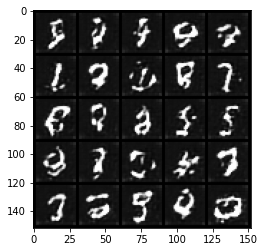

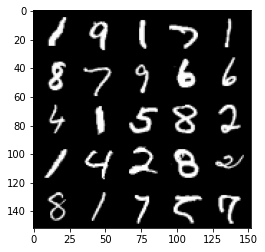

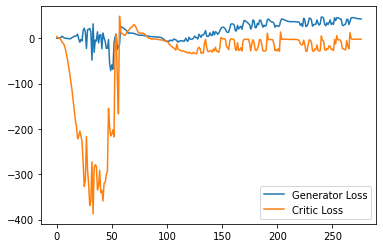

Step 5600: Generator loss: 42.327120513916014, critic loss: -2.703907104492188


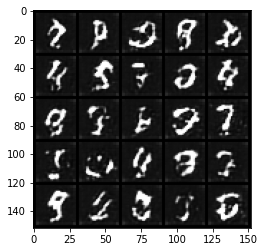

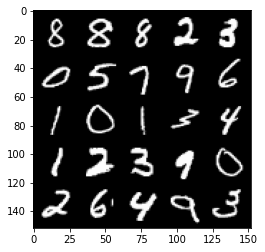

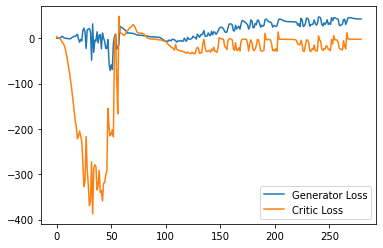

Step 5650: Generator loss: 42.352080078125, critic loss: -2.922638084411621


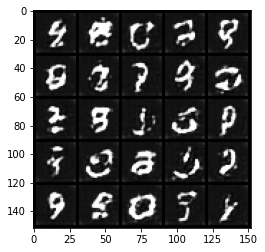

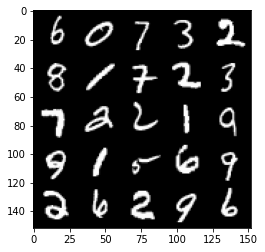

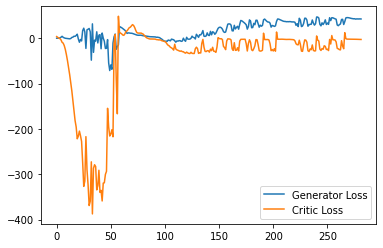

Step 5700: Generator loss: 42.26980728149414, critic loss: -3.153659309387208


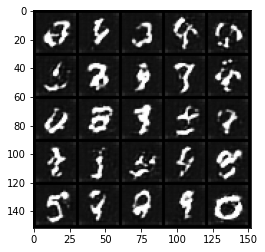

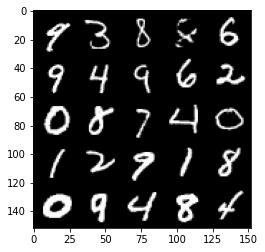

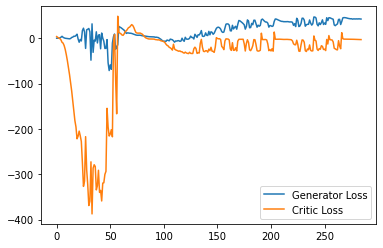

Step 5750: Generator loss: 42.248090286254886, critic loss: -3.40520457649231


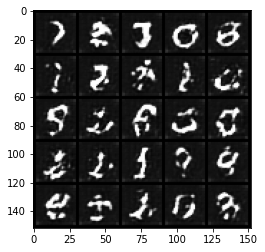

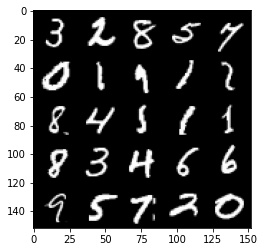

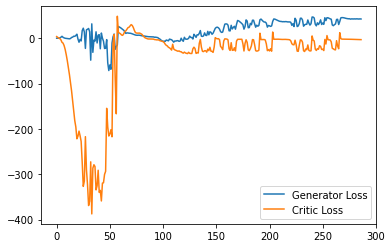

Step 5800: Generator loss: 42.45351272583008, critic loss: -3.537751445770262


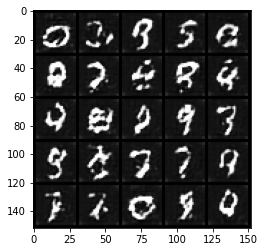

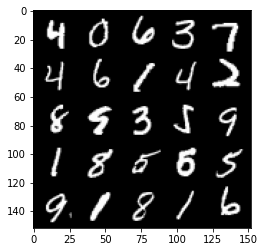

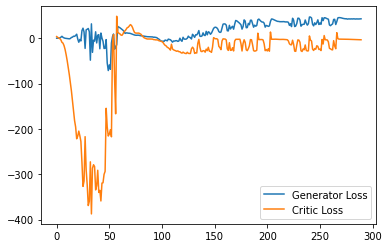

Step 5850: Generator loss: 42.98192710876465, critic loss: -4.305480313301087


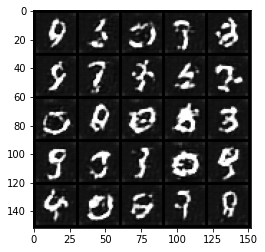

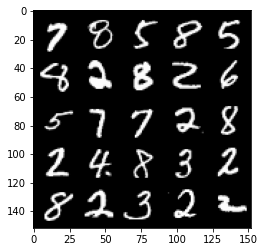

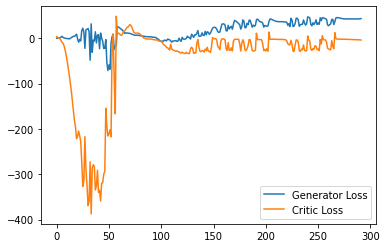

Step 5900: Generator loss: 42.71655006408692, critic loss: 0.032782180309295604


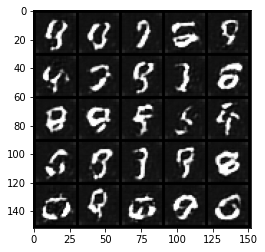

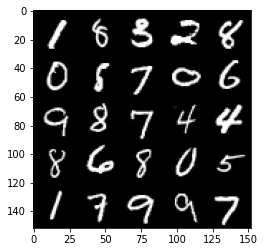

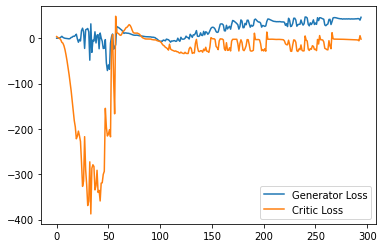

Step 5950: Generator loss: 44.98430709838867, critic loss: -2.297407856941223


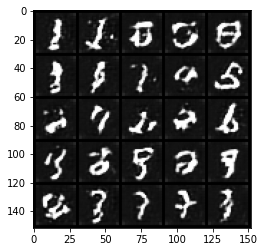

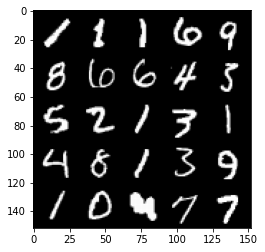

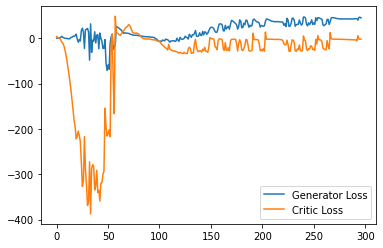

Step 6000: Generator loss: 43.371399002075194, critic loss: -2.6085383386611944


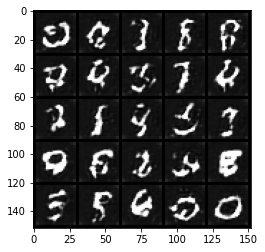

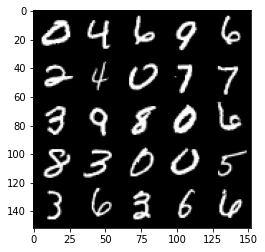

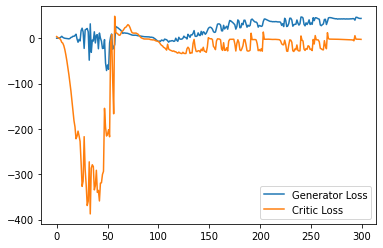

Step 6050: Generator loss: 42.96192398071289, critic loss: -3.0103307075500485


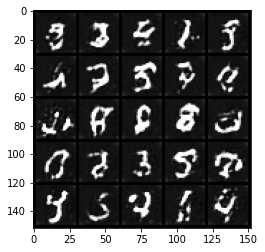

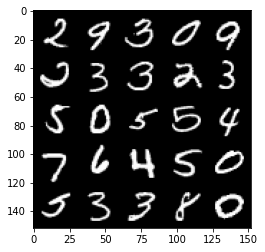

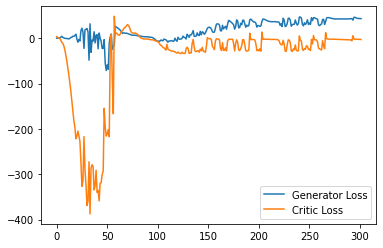

Step 6100: Generator loss: 42.78965744018555, critic loss: -3.537315699577332


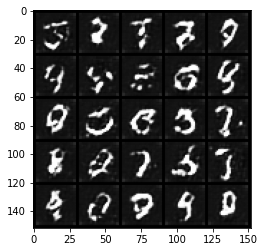

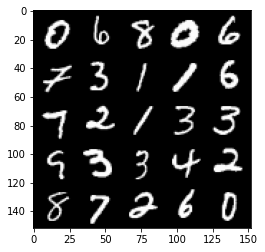

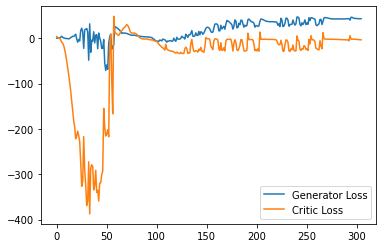

Step 6150: Generator loss: 41.88127826690674, critic loss: -3.2273486728668206


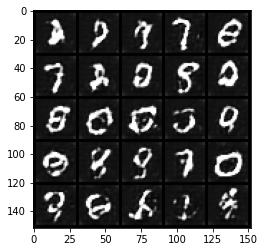

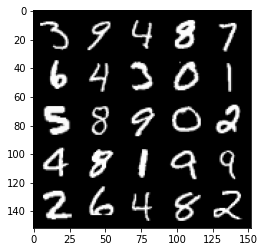

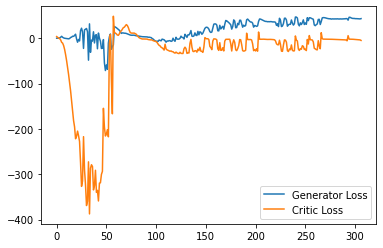

Step 6200: Generator loss: 45.06679153442383, critic loss: -2.614262176036834


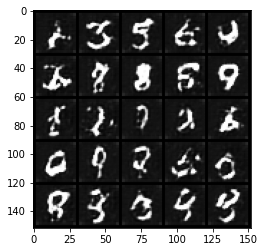

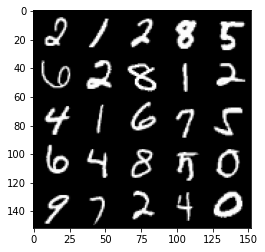

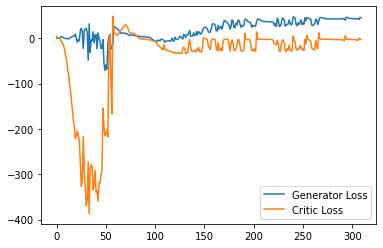

Step 6250: Generator loss: 44.155695877075196, critic loss: -3.4209277362823487


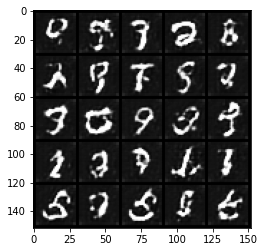

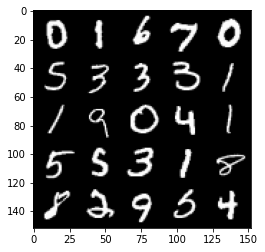

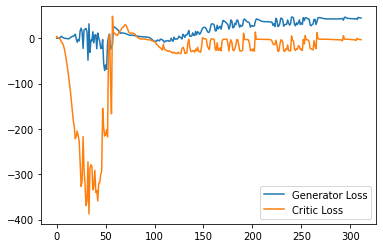

Step 6300: Generator loss: 42.62612457275391, critic loss: -5.810334182739257


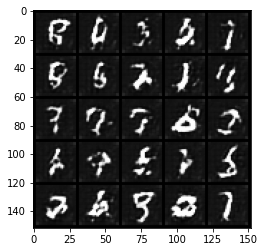

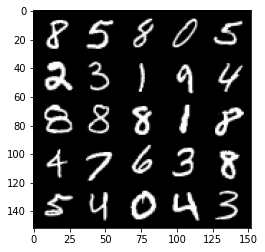

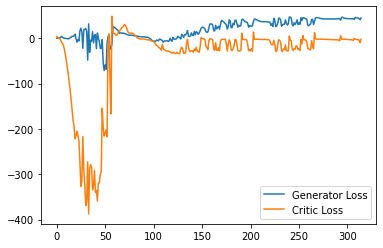

Step 6350: Generator loss: 42.03793422698975, critic loss: -11.273290284156799


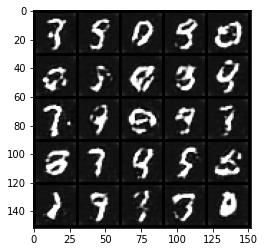

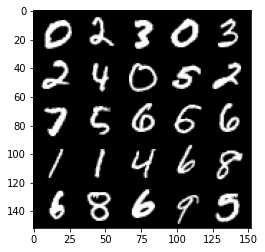

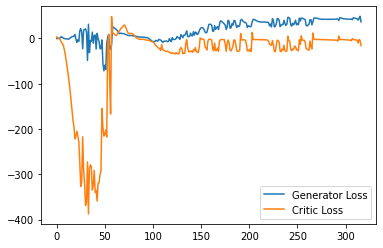

Step 6400: Generator loss: 40.85206619262695, critic loss: 3.4392024846076943


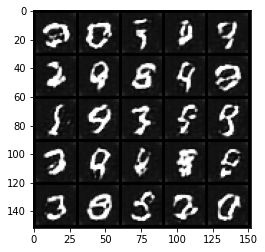

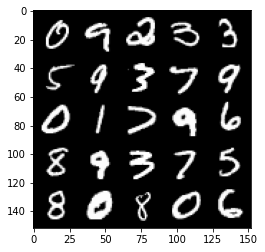

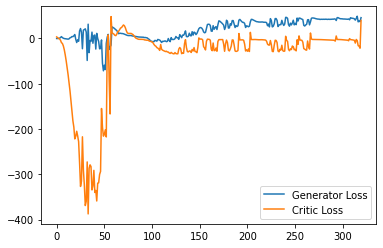

Step 6450: Generator loss: 51.28269920349121, critic loss: -2.3027108583450313


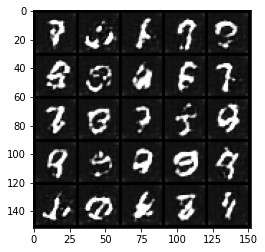

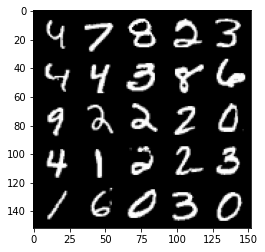

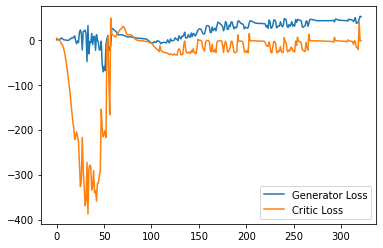

Step 6500: Generator loss: 47.78970527648926, critic loss: -2.0439183735847477


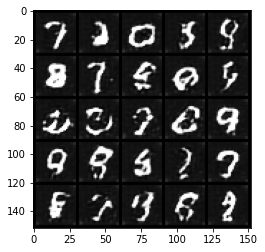

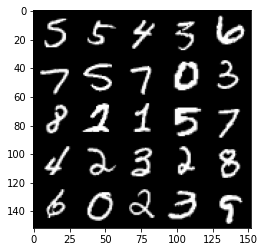

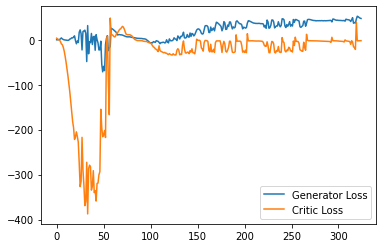

Step 6550: Generator loss: 46.47742240905762, critic loss: -2.162576362133026


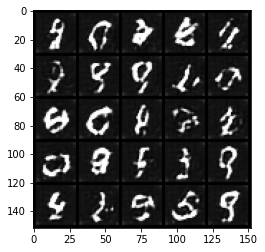

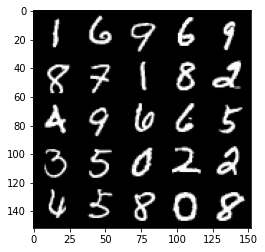

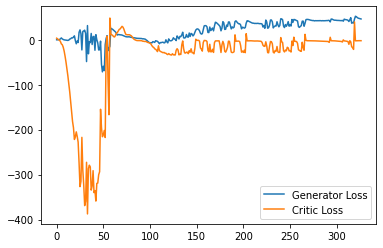

Step 6600: Generator loss: 45.96848701477051, critic loss: -2.3662459750175477


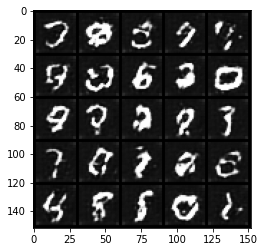

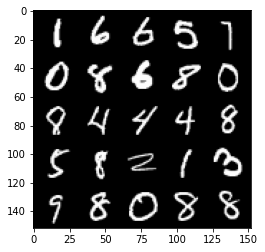

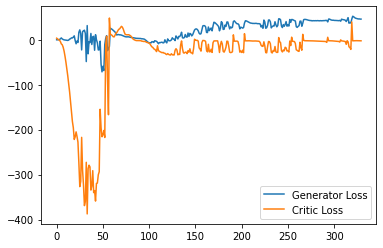

Step 6650: Generator loss: 45.71073051452637, critic loss: -2.4404194054603576


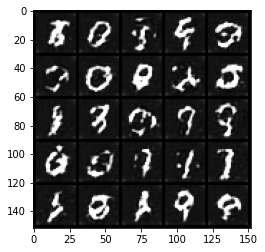

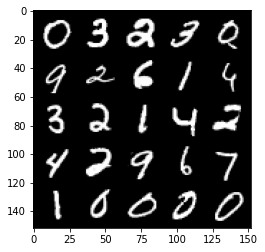

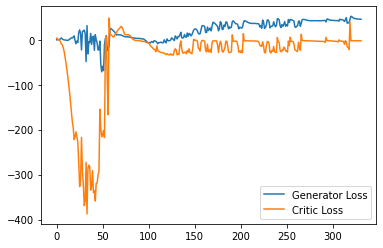

Step 6700: Generator loss: 45.306078872680665, critic loss: -2.56206676864624


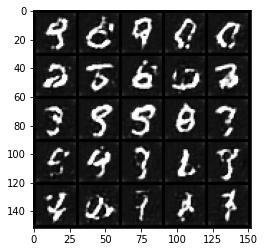

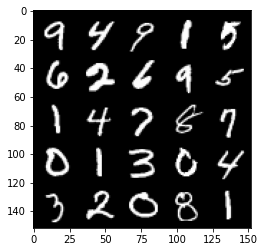

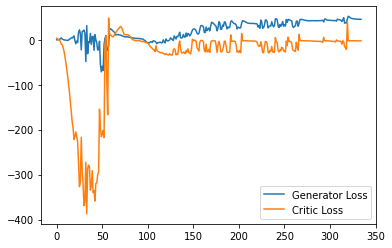

Step 6750: Generator loss: 45.282143173217776, critic loss: -2.664294401168823


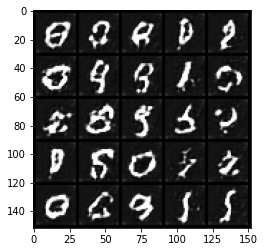

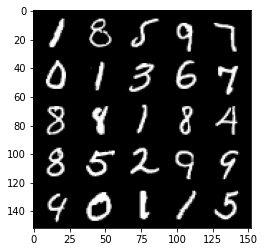

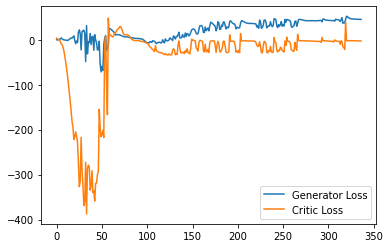

Step 6800: Generator loss: 45.24502960205078, critic loss: -2.8116963996887203


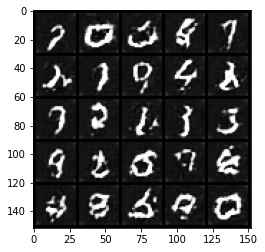

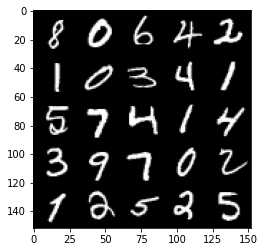

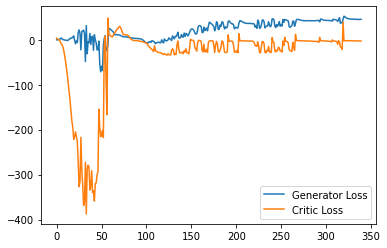

Step 6850: Generator loss: 45.47660140991211, critic loss: -3.1382613868713385


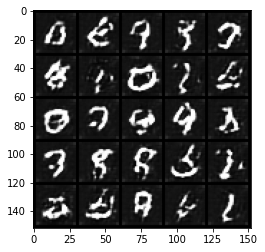

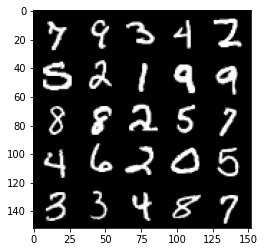

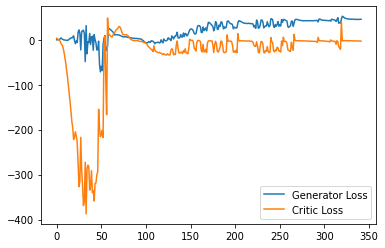

Step 6900: Generator loss: 45.629871215820316, critic loss: -3.6713334188461304


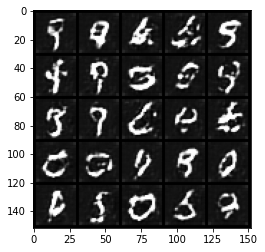

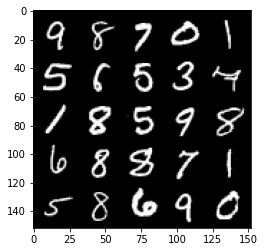

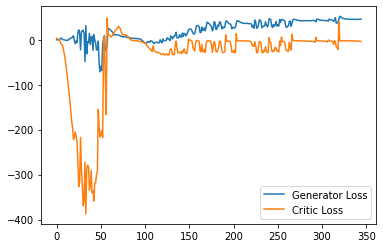

Step 6950: Generator loss: 40.95894878387451, critic loss: -10.350229167938235


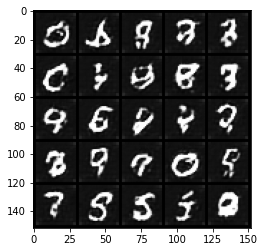

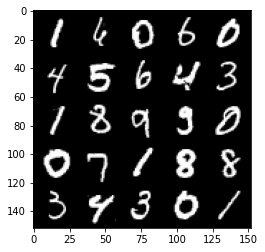

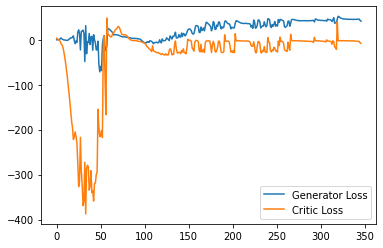

Step 7000: Generator loss: 44.078829803466796, critic loss: -10.972505410194394


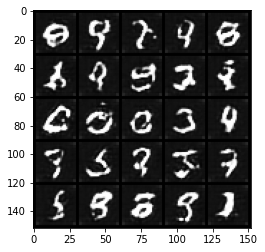

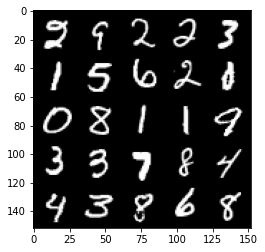

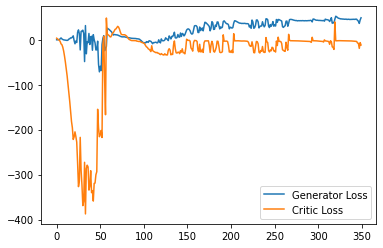

Step 7050: Generator loss: 38.61706703186035, critic loss: -20.33828254890442


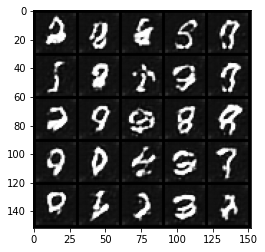

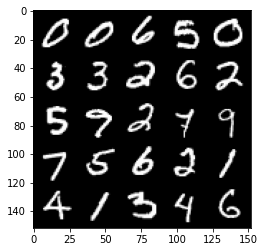

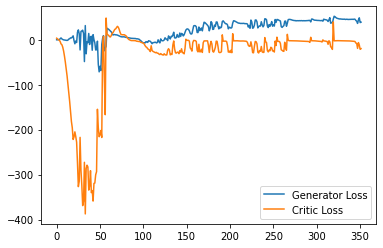

Step 7100: Generator loss: 40.26536075592041, critic loss: -17.362863215446474


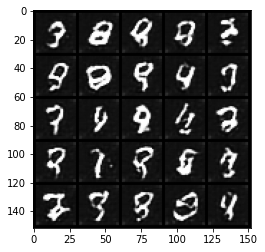

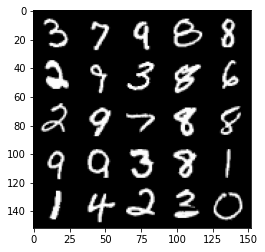

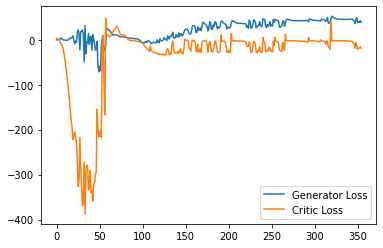

Step 7150: Generator loss: 50.148157348632814, critic loss: 3.901581512451175


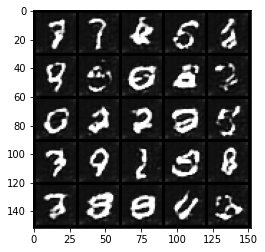

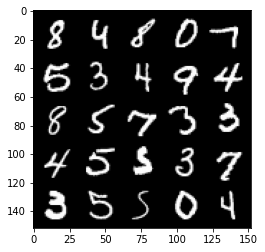

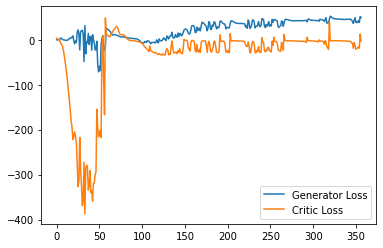

Step 7200: Generator loss: 49.175054702758786, critic loss: -2.6371634702682503


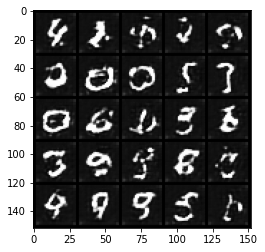

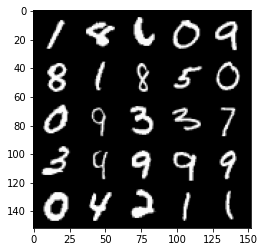

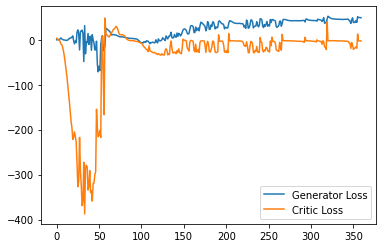

Step 7250: Generator loss: 48.614120635986325, critic loss: -2.8269543561935415


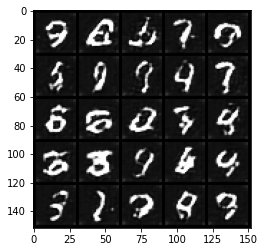

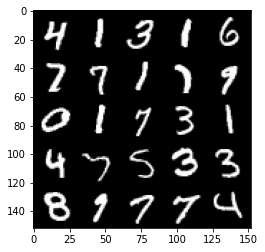

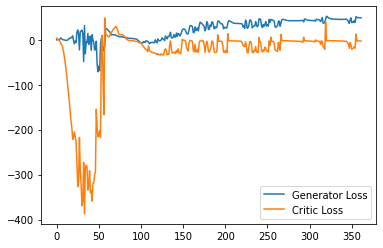

Step 7300: Generator loss: 47.542663650512694, critic loss: -3.015110271453857


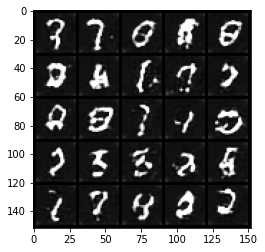

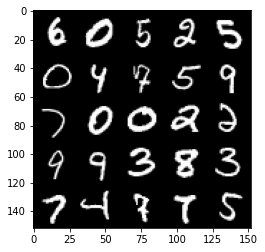

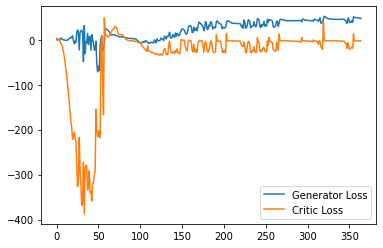

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
